# Classification: Predict Diagnosis of a Breast Tumor as Malignant or Benign

## 1. Problem Statement

Breast cancer is the most common malignancy among women, accounting for nearly 1 in 3 cancers diagnosed among women in the United States, and it is the second leading cause of cancer death among women. Breast Cancer occurs as a result of abnormal growth of cells in the breast tissue, commonly referred to as a Tumor. A tumor does not mean cancer - tumors can be benign (not cancerous), pre-malignant (pre-cancerous), or malignant (cancerous). Tests such as MRI, mammogram, ultrasound and biopsy are commonly used to diagnose breast cancer performed.

### 1.1 Expected outcome
Given breast cancer results from breast fine needle aspiration (FNA) test (is a quick and simple procedure to perform, which removes some fluid or cells from a breast lesion or cyst (a lump, sore or swelling) with a fine needle similar to a blood sample needle). Features are computed from the digitized image of the FNA of the breast mass. They describe characteristics of the cell nuclei present in the image. Use these characteristics build a model that can classify a breast cancer tumor using two categories:
* 1= Malignant (Cancerous) - Present
* 0= Benign (Not Cancerous) - Absent

### 1.2 Objective 
Since the labels in the data are discrete, the prediction falls into two categories, (i.e. Malignant or Benign). In machine learning this is a classification problem. 
        
Thus, the goal is to classify whether the breast cancer is Malignant or Benign and predict the recurrence and non-recurrence of malignant cases after a certain period. To achieve this we have used machine learning classification methods to fit a function that can predict the discrete class of new input.

### 1.3 Get the Data
The [Breast Cancer](https://archive.ics.uci.edu/ml/datasets/Breast+Cancer+Wisconsin+%28Diagnostic%29) datasets is available machine learning repository maintained by the University of California, Irvine. The dataset contains **569 samples of malignant and benign tumor cells**. 
* The first two columns in the dataset store the unique ID numbers of the samples and the corresponding diagnosis (M=malignant, B=benign), respectively. 
* The columns 3-32 contain 30 real-value features that have been computed from digitized images of the cell nuclei, which can be used to build a model to predict whether a tumor is benign or malignant.

Ten real-valued features are computed for each cell nucleus:

	a) radius (mean of distances from center to points on the perimeter)
	b) texture (standard deviation of gray-scale values)
	c) perimeter
	d) area
	e) smoothness (local variation in radius lengths)
	f) compactness (perimeter^2 / area - 1.0)
	g) concavity (severity of concave portions of the contour)
	h) concave points (number of concave portions of the contour)
	i) symmetry 
	j) fractal dimension ("coastline approximation" - 1)

In [1]:
import pandas as pd
import numpy as np

# Visualization
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

pd.set_option('display.max_columns', 500)
pd.set_option('display.max_colwidth', 20)

plt.style.use('seaborn-whitegrid')

# this allows plots to appear directly in the notebook
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [3]:
rnd_seed=23
np.random.seed(rnd_seed)

In [4]:
# read the data
all_df = pd.read_csv('data/data.csv', index_col=False)
all_df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [5]:
all_df.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

In [6]:
# Id column is redundant and not useful, we want to drop it
all_df.drop('id', axis=1, inplace=True)

### 1.4 Quick Glance on the Data

In [7]:
# The info() method is useful to get a quick description of the data, in particular the total number of rows, 
# and each attribute’s type and number of non-null values
all_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
diagnosis                  569 non-null object
radius_mean                569 non-null float64
texture_mean               569 non-null float64
perimeter_mean             569 non-null float64
area_mean                  569 non-null float64
smoothness_mean            569 non-null float64
compactness_mean           569 non-null float64
concavity_mean             569 non-null float64
concave points_mean        569 non-null float64
symmetry_mean              569 non-null float64
fractal_dimension_mean     569 non-null float64
radius_se                  569 non-null float64
texture_se                 569 non-null float64
perimeter_se               569 non-null float64
area_se                    569 non-null float64
smoothness_se              569 non-null float64
compactness_se             569 non-null float64
concavity_se               569 non-null float64
concave points_se          569 n

In [8]:
# check if any column has null values
all_df.isnull().any()

diagnosis                  False
radius_mean                False
texture_mean               False
perimeter_mean             False
area_mean                  False
smoothness_mean            False
compactness_mean           False
concavity_mean             False
concave points_mean        False
symmetry_mean              False
fractal_dimension_mean     False
radius_se                  False
texture_se                 False
perimeter_se               False
area_se                    False
smoothness_se              False
compactness_se             False
concavity_se               False
concave points_se          False
symmetry_se                False
fractal_dimension_se       False
radius_worst               False
texture_worst              False
perimeter_worst            False
area_worst                 False
smoothness_worst           False
compactness_worst          False
concavity_worst            False
concave points_worst       False
symmetry_worst             False
fractal_di

There are 569 instances in the dataset, which means that it is very small by Machine Learning standards, but it's perfect to get started. Notice that the none of the attributes have missing values. All attributes are numerical, except the `diagnosis` field.

**Visualizing Missing Values**

The `missingno` package also provides a small toolset of flexible and easy-to-use missing data visualizations and utilities that allows us to get a quick visual summary of the completeness (or lack thereof) of our dataset.

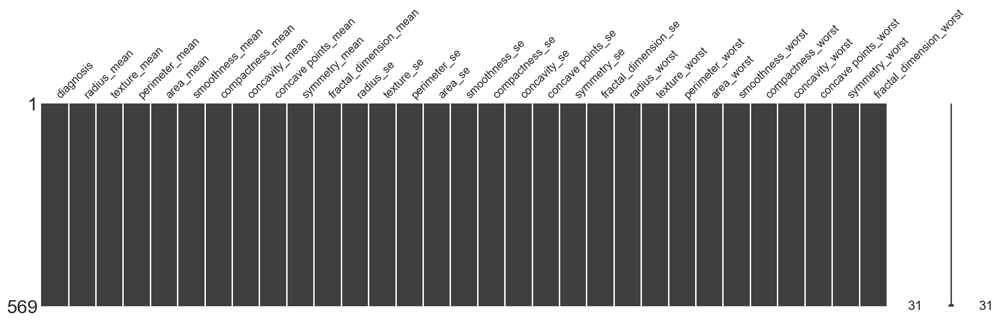

In [9]:
import missingno as msno
msno.matrix(all_df.sample(len(all_df)), figsize=(18, 4), fontsize=12)

In [10]:
# Review number of columns of each data type in a DataFrame:
all_df.get_dtype_counts()

float64    30
object      1
dtype: int64

In [11]:
# check the categorical attribute's distribution
all_df['diagnosis'].value_counts()

B    357
M    212
Name: diagnosis, dtype: int64

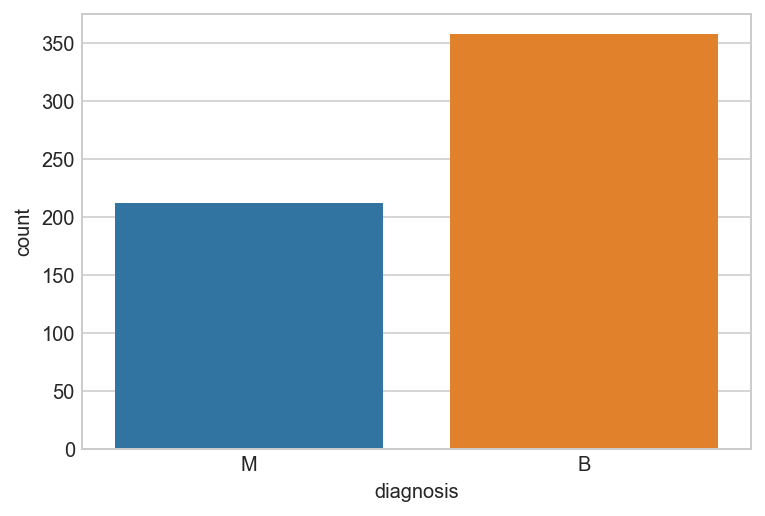

In [12]:
sns.countplot(x="diagnosis", data=all_df);

## 2: Exploratory Data Analysis

Now that we have a good intuitive sense of the data, Next step involves taking a closer look at attributes and data values. In this section, we will be getting familiar with the data, which will provide useful knowledge for data pre-processing.

### 2.1 Objectives of Data Exploration

Exploratory data analysis (EDA) is a very important step which takes place after feature engineering and acquiring data and it should be done before any modeling. This is because it is very important for a data scientist to be able to understand the nature of the data without making assumptions. The results of data exploration can be extremely useful in grasping the structure of the data, the distribution of the values, and the presence of extreme values and interrelationships within the data set.

**The purpose of EDA is:**
* To use summary statistics and visualizations to better understand data, find clues about the tendencies of the data, its quality and to formulate assumptions and the hypothesis of our analysis.
* For data preprocessing to be successful, it is essential to have an overall picture of our data. Basic statistical descriptions can be used to identify properties of the data and highlight which data values should be treated as noise or outliers.

Next step is to explore the data. There are two approaches used to examine the data using:

1. ***Descriptive statistics*** is the process of condensing key characteristics of the data set into simple numeric metrics. Some of the common metrics used are mean, standard deviation, and correlation. 
	
2. ***Visualization*** is the process of projecting the data, or parts of it, into Cartesian space or into abstract images. In the data mining process, data exploration is leveraged in many different steps including preprocessing, modeling, and interpretation of results.

Let's look at the other fields. The `describe()` method shows a summary of the numerical attributes

In [13]:
all_df.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,0.405172,1.216853,2.866059,40.337079,0.007041,0.025478,0.031894,0.011796,0.020542,0.003795,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,0.277313,0.551648,2.021855,45.491006,0.003003,0.017908,0.030186,0.006170,0.008266,0.002646,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,0.111500,0.360200,0.757000,6.802000,0.001713,0.002252,0.000000,0.000000,0.007882,0.000895,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,0.232400,0.833900,1.606000,17.850000,0.005169,0.013080,0.015090,0.007638,0.015160,0.002248,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,0.324200,1.108000,2.287000,24.530000,0.006380,0.020450,0.025890,0.010930,0.018730,0.003187,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,0.478900,1.474000,3.357000,45.190000,0.008146,0.032450,0.042050,0.014710,0.023480,0.004558,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,2.873000,4.885000,21.980000,542.200000,0.031130,0.135400,0.396000,0.052790,0.078950,0.029840,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


### 2.2 Unimodal Data Visualizations

One of the main goals of visualizing the data here is to observe which features are most helpful in predicting malignant or benign cancer. The other is to see general trends that may aid us in model selection and hyper parameter selection.

Apply 3 techniques that we can use to understand each attribute of your dataset independently.
* Histograms.
* Density Plots.
* Box and Whisker Plots.

#### 2.2.1. Visualise distribution of data via Histograms
Histograms are commonly used to visualize numerical variables. A histogram is similar to a bar graph after the values of the variable are grouped (binned) into a finite number of intervals (bins).

Histograms group data into bins and provide us a count of the number of observations in each bin. From the shape of the bins we can quickly get a feeling for whether an attribute is Gaussian, skewed or even has an exponential distribution. It can also help us see possible outliers.

In [14]:
all_df.columns

Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

#### Separate columns into smaller dataframes to perform visualization
Break up columns into groups, according to their suffix designation \(_mean, _se, and _worst) to perform visualization plots off. 

#### Histogram the "_mean" suffix features

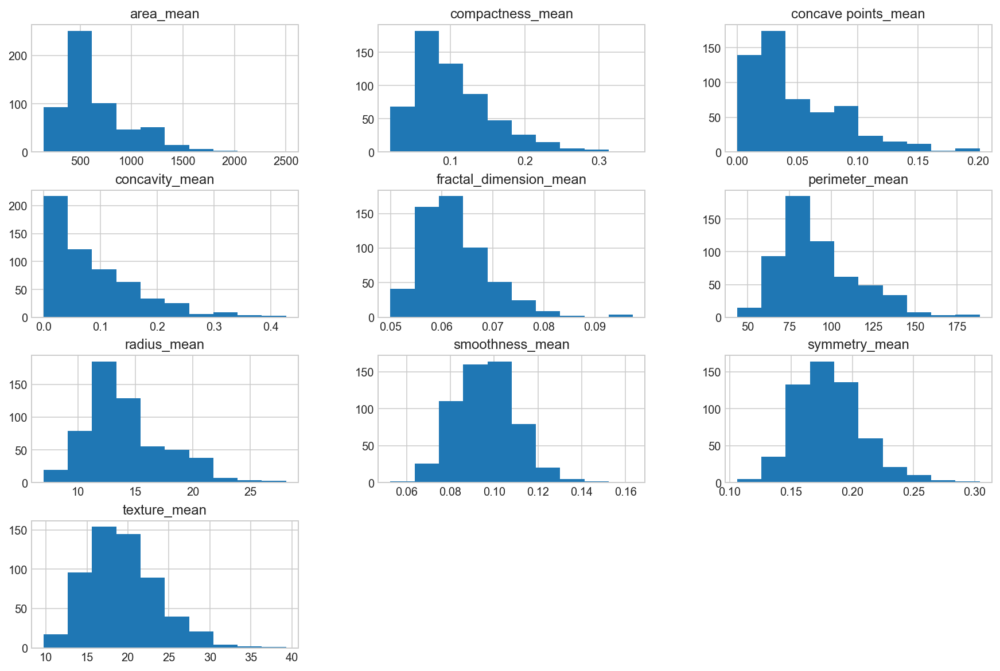

In [15]:
data_mean = all_df.iloc[:, 1:11]
data_mean.hist(bins=10, figsize=(15, 10), grid=True);

#### Histogram the "_se" suffix features

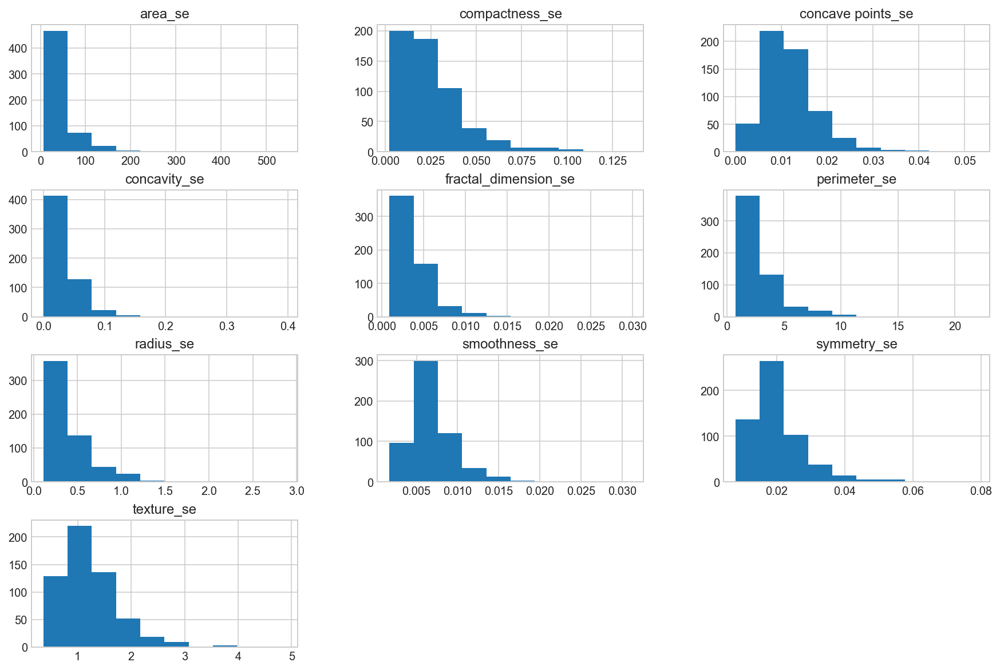

In [16]:
data_mean = all_df.iloc[:, 11:21]
data_mean.hist(bins=10, figsize=(15, 10), grid=True);

#### Histogram the "_worst" suffix features

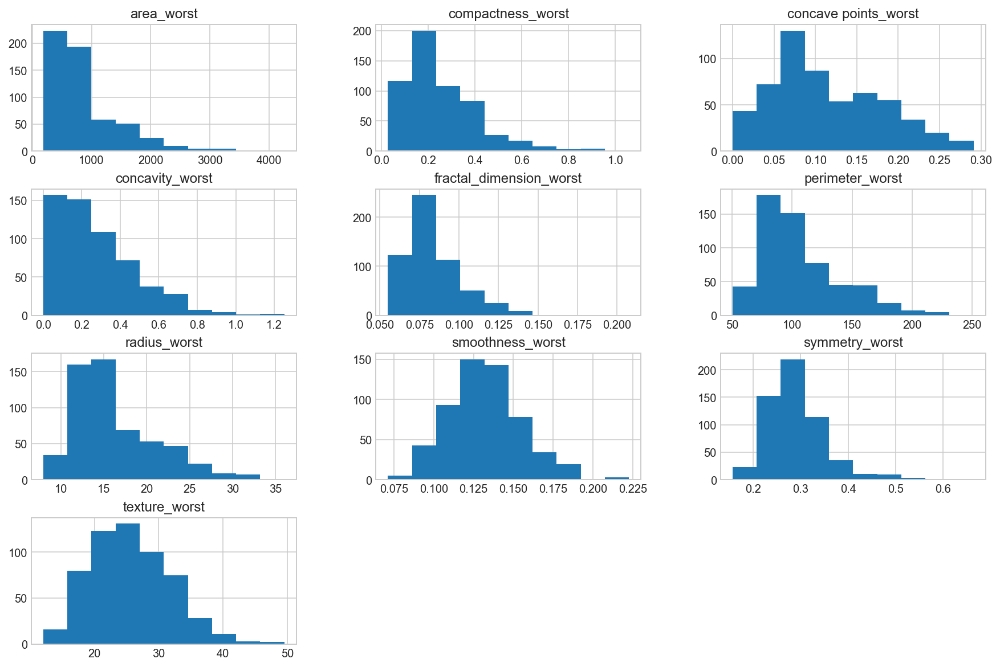

In [17]:
data_mean = all_df.iloc[:, 21:]
data_mean.hist(bins=10, figsize=(15, 10), grid=True);

**Observation**

We can see that perhaps the attributes  **concavity** and **area** may have an exponential distribution ( ). We can also see that perhaps the **texture**, **smooth** and **symmetry** attributes may have a Gaussian or nearly Gaussian distribution. This is interesting because many machine learning techniques assume a Gaussian univariate distribution on the input variables.

#### 2.2.2. Visualise distribution of data via Density plots

#### Density plots of the "_mean" suffix features

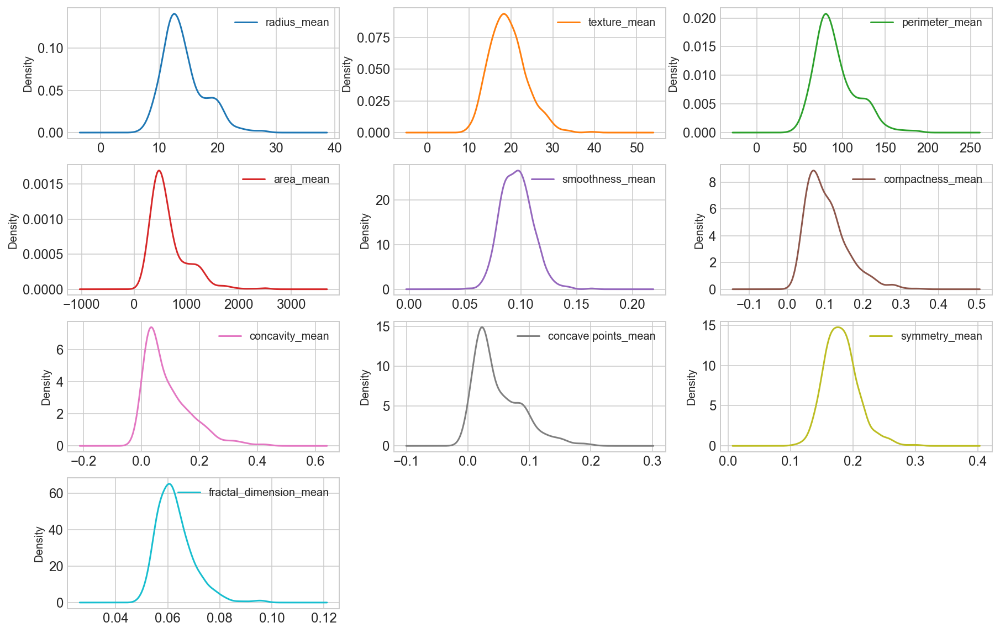

In [18]:
data_mean = all_df.iloc[:, 1:11]
data_mean.plot(kind='density', subplots=True, layout=(4,3), sharex=False, sharey=False, fontsize=12, figsize=(15,10));

#### Density plots of the "_se" suffix features

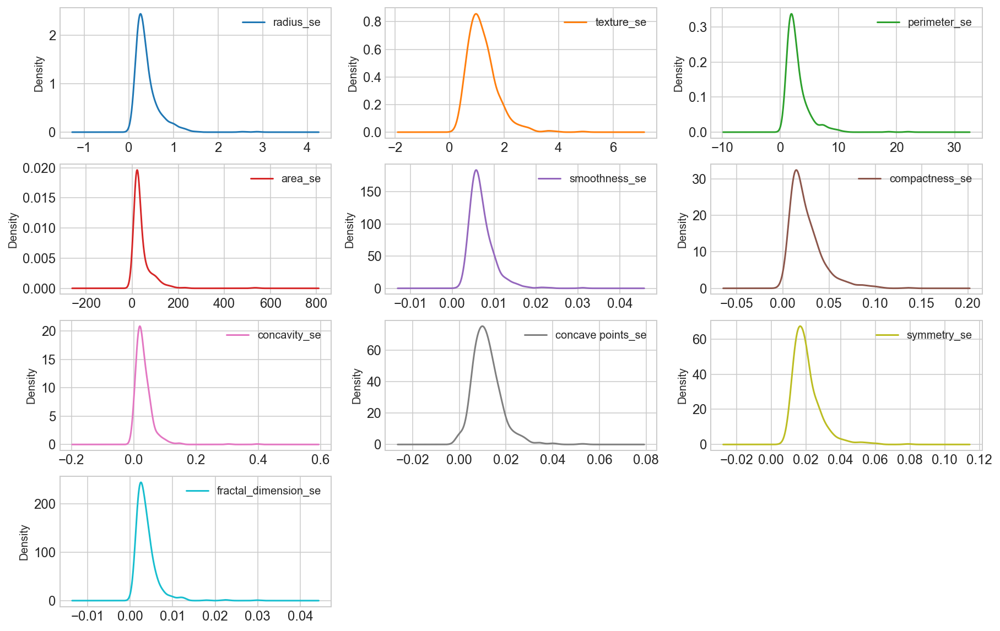

In [19]:
data_mean = all_df.iloc[:, 11:21]
data_mean.plot(kind='density', subplots=True, layout=(4,3), sharex=False, sharey=False, fontsize=12, figsize=(15,10));

#### Density plots of the "_worst" suffix features

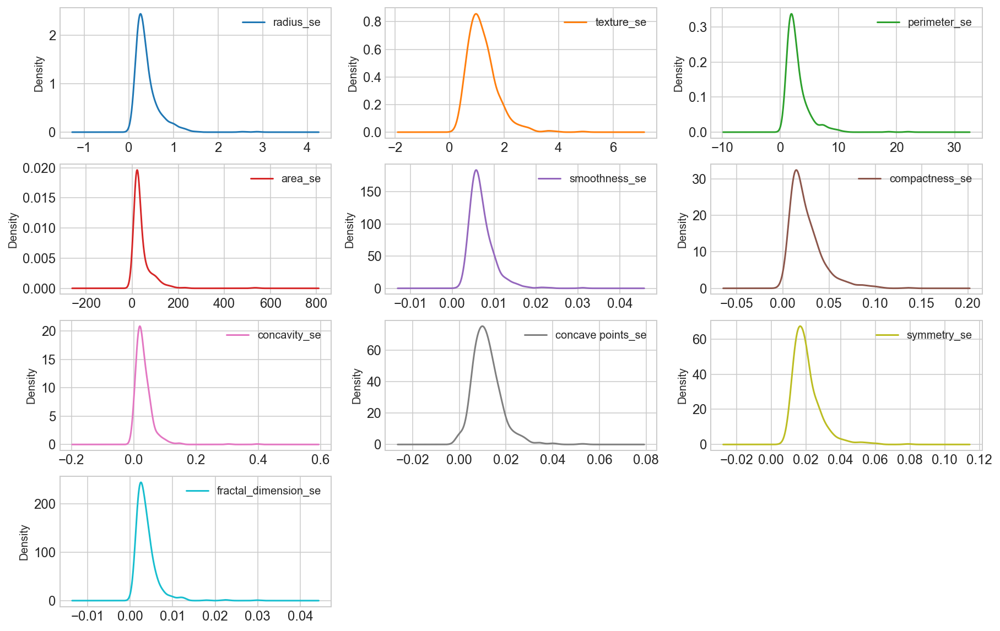

In [20]:
all_df.iloc[:, 21:]
data_mean.plot(kind='density', subplots=True, layout=(4,3), sharex=False, sharey=False, fontsize=12, figsize=(15,10));

**Observation**

We can see that perhaps the attributes **perimeter**, **radius**, **area**, **concavity**, **compactness** may have an exponential distribution ( ). We can also see that perhaps the **texture**, **smooth**, **symmetry** attributes may have a Gaussian or nearly Gaussian distribution. This is interesting because many machine learning techniques assume a Gaussian univariate distribution on the input variables.

#### 2.2.3. Visualize distribution of data via Box plots

#### Box plots of the "_mean" suffix features

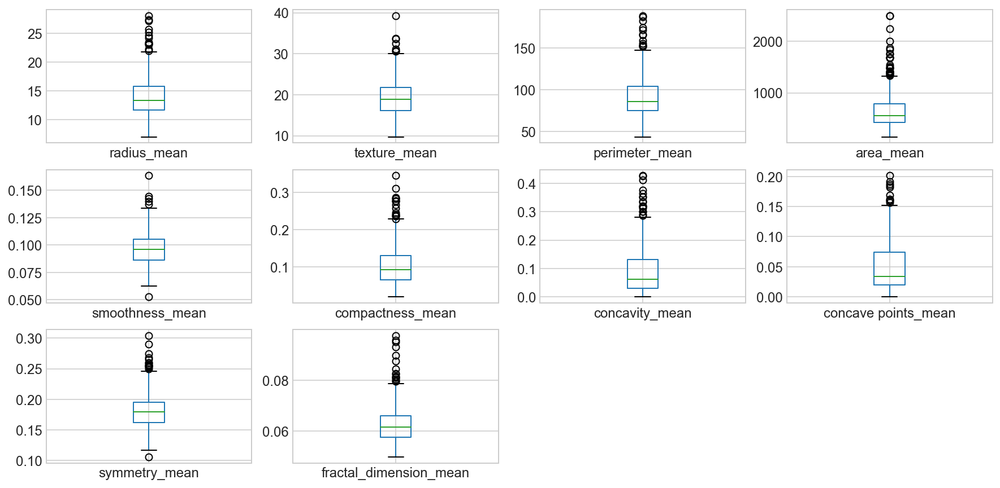

In [21]:
data_mean = all_df.iloc[:, 1:11]
data_mean.plot(kind='box', subplots=True, layout=(4,4), sharex=False, sharey=False, fontsize=12, figsize=(15,10));

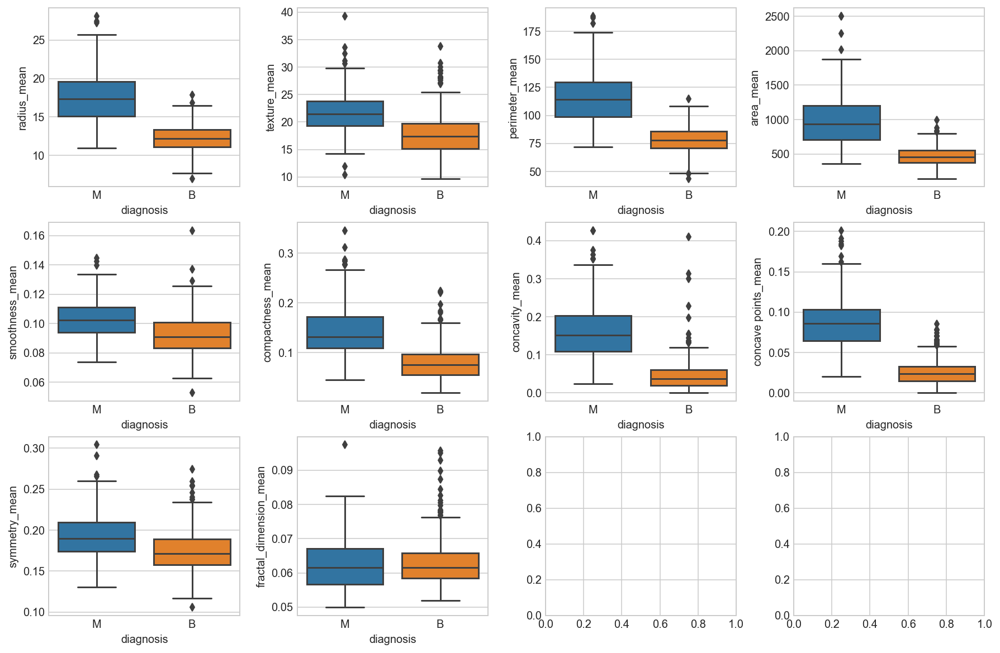

In [22]:
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(15,10))
fig.subplots_adjust(hspace =.2, wspace=.3)
axes = axes.ravel()
for i, col in enumerate(all_df.columns[1:11]):
    _= sns.boxplot(y=col, x='diagnosis', data=all_df, ax=axes[i])

#### Box plots of the "_se" suffix features

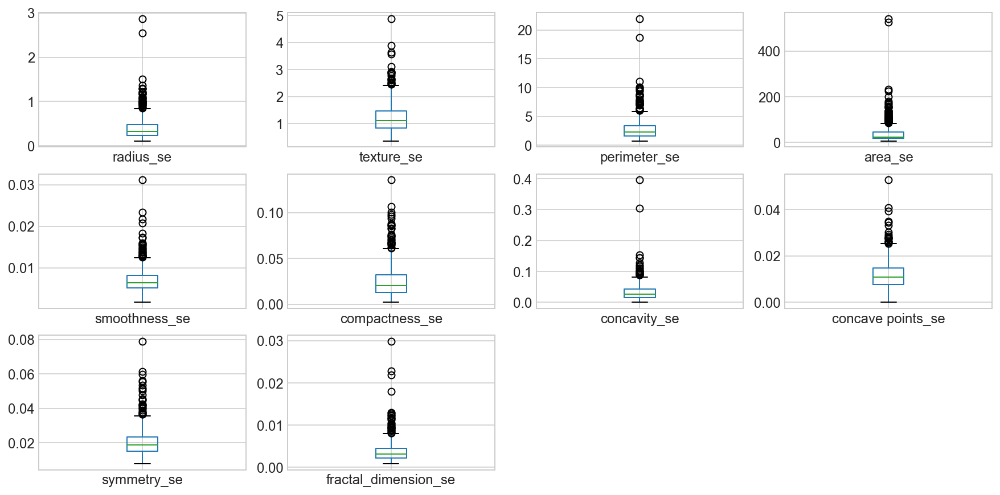

In [23]:
data_mean = all_df.iloc[:, 11:21]
data_mean.plot(kind='box', subplots=True, layout=(4,4), sharex=False, sharey=False, fontsize=12, figsize=(15,10));

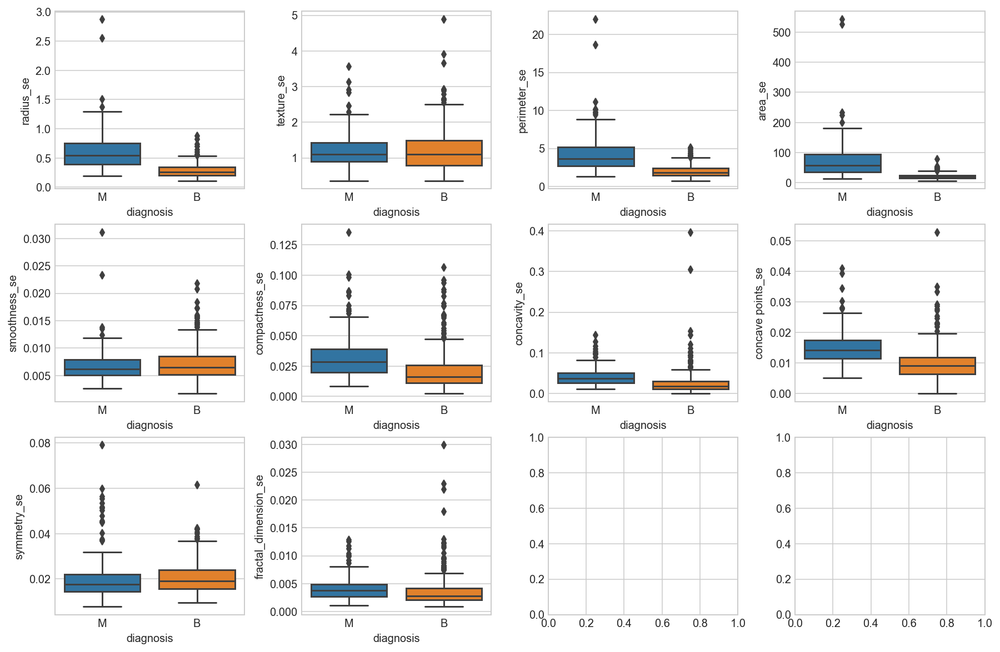

In [24]:
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(15,10))
fig.subplots_adjust(hspace =.2, wspace=.3)
axes = axes.ravel()
for i, col in enumerate(all_df.columns[11:21]):
    _= sns.boxplot(y=col, x='diagnosis', data=all_df, ax=axes[i])

#### Box plots of the "_worst" suffix features

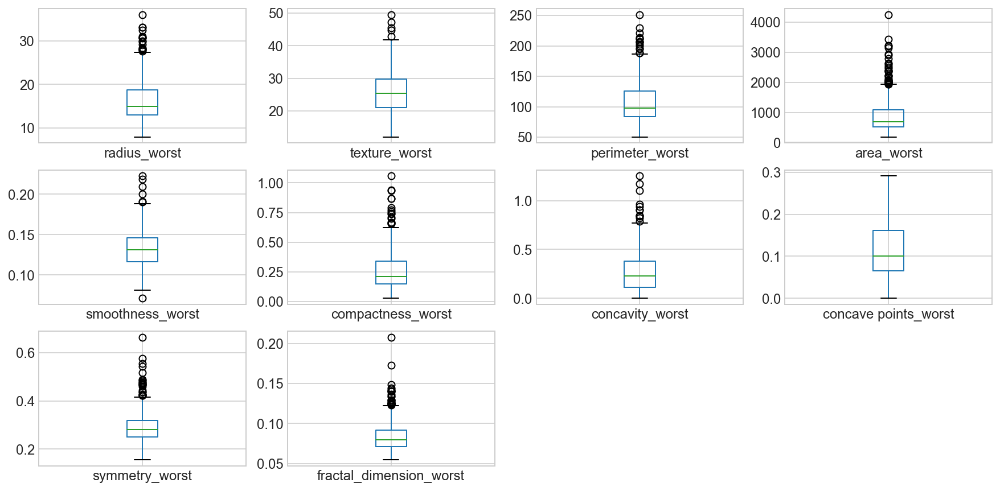

In [25]:
data_mean = all_df.iloc[:, 21:]
data_mean.plot(kind='box', subplots=True, layout=(4,4), sharex=False, sharey=False, fontsize=12, figsize=(15,10));

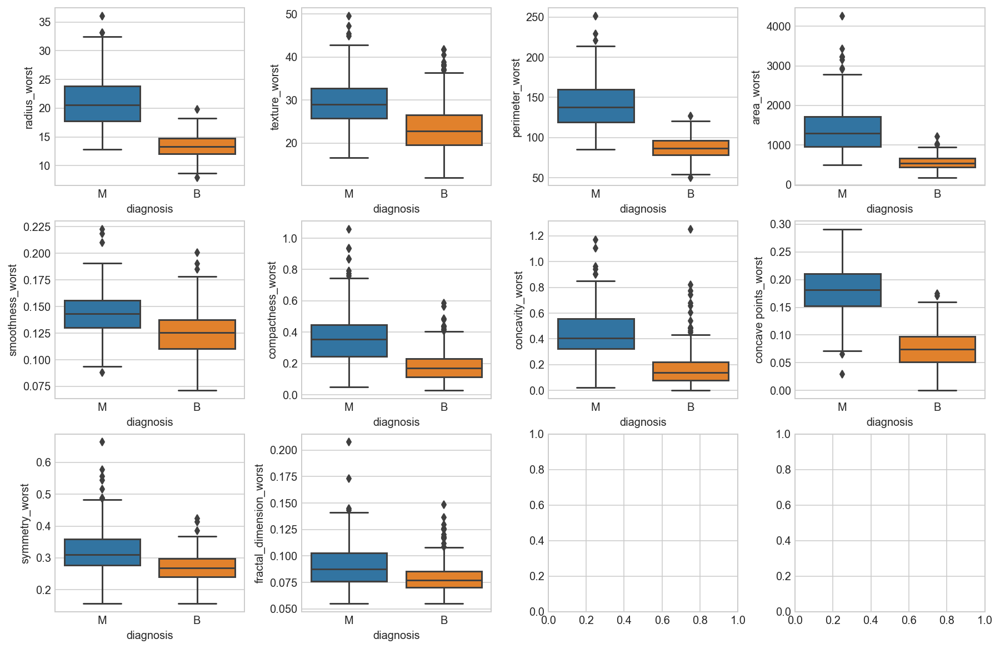

In [26]:
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(15,10))
fig.subplots_adjust(hspace =.2, wspace=.3)
axes = axes.ravel()
for i, col in enumerate(all_df.columns[21:]):
    _= sns.boxplot(y=col, x='diagnosis', data=all_df, ax=axes[i])

**Observation**

We can see that perhaps the attributes **perimeter**, **radius**, **area**, **concavity**, **compactness** may have an exponential distribution. We can also see that perhaps the **texture**, **smooth** and **symmetry** attributes may have a Gaussian or nearly Gaussian distribution. This is interesting because many machine learning techniques assume a Gaussian univariate distribution on the input variables.

### 2.3. Multimodal Data Visualizations
* Correlation Matrix  
* Scatter Plots  

#### Correlation Matrix

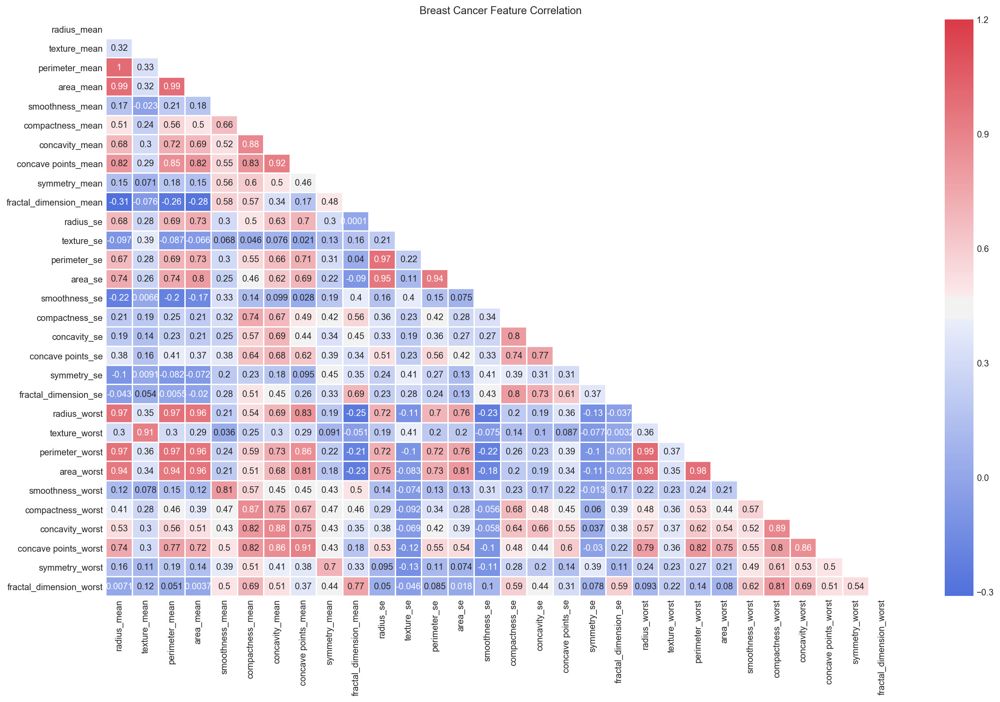

In [27]:
# Compute the correlation matrix
corrMatt = all_df.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corrMatt)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
fig, ax = plt.subplots(figsize=(20, 12))
plt.title('Breast Cancer Feature Correlation')

# Generate a custom diverging colormap
cmap = sns.diverging_palette(260, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corrMatt, vmax=1.2, square=False, cmap=cmap, mask=mask, ax=ax, annot=True, fmt='.2g', linewidths=1);
#sns.heatmap(corrMatt, mask=mask, vmax=1.2, square=True, annot=True, fmt='.2g', ax=ax);

**Observation:**

We can see strong positive relationship exists with mean values paramaters between 1 - 0.75.
* The mean area of the tissue nucleus has a strong positive correlation with mean values of radius and parameter.
* Some paramters are moderately positive correlated (r between 0.5-0.75) are concavity and area, concavity and perimeter etc.
* Likewise, we see some strong negative correlation between fractal_dimension with radius, texture, perimeter mean values.

#### Scatter Plots

#### Scatter plots of the "_mean" suffix features

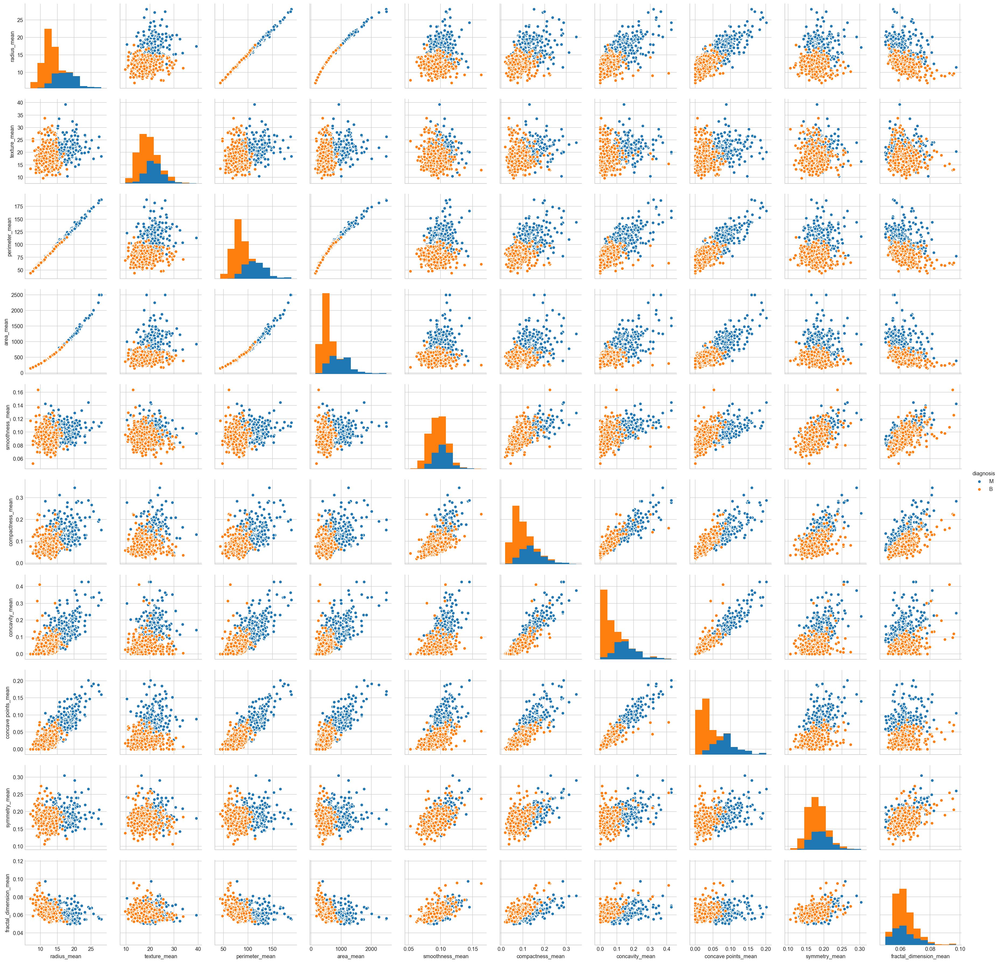

In [28]:
sns.pairplot(all_df[list(all_df.columns[1:11]) + ['diagnosis']], hue="diagnosis");

#### Scatter plots of the "_se" suffix features

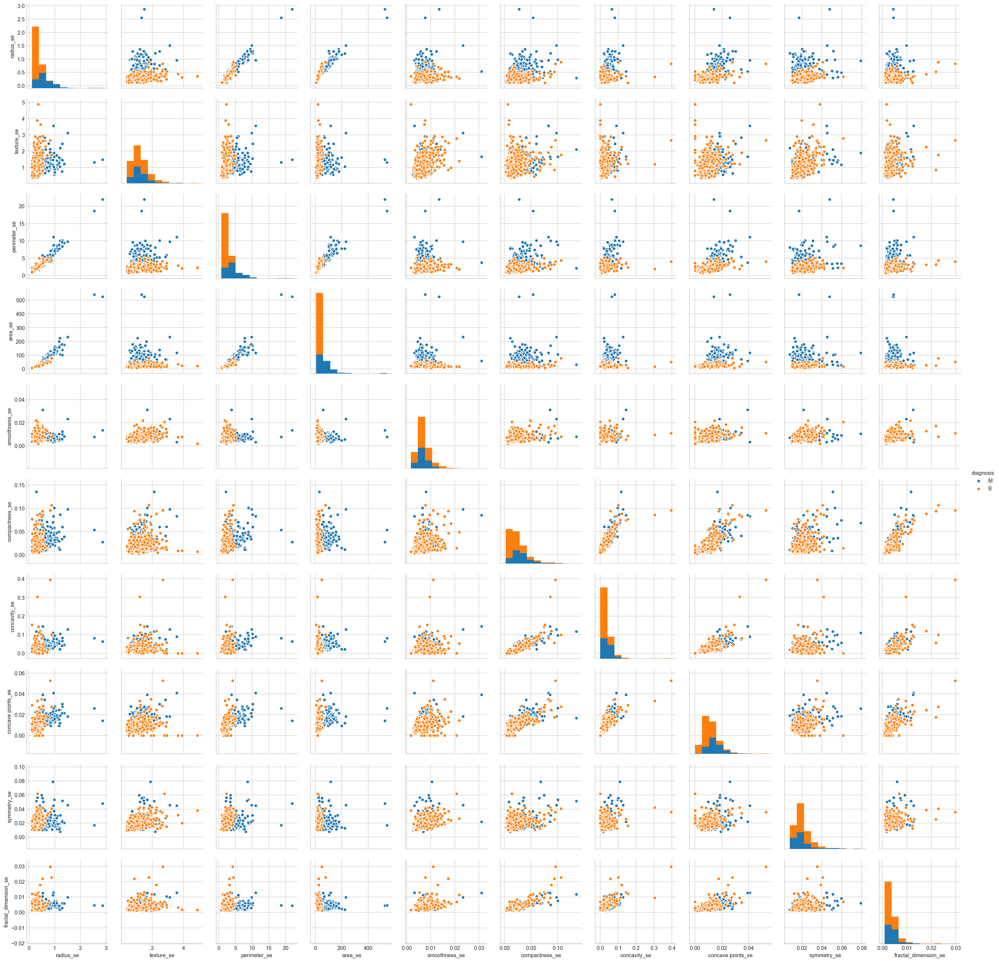

In [29]:
sns.pairplot(all_df[list(all_df.columns[11:21]) + ['diagnosis']], hue="diagnosis");

#### Scatter plots of the "_worst" suffix features

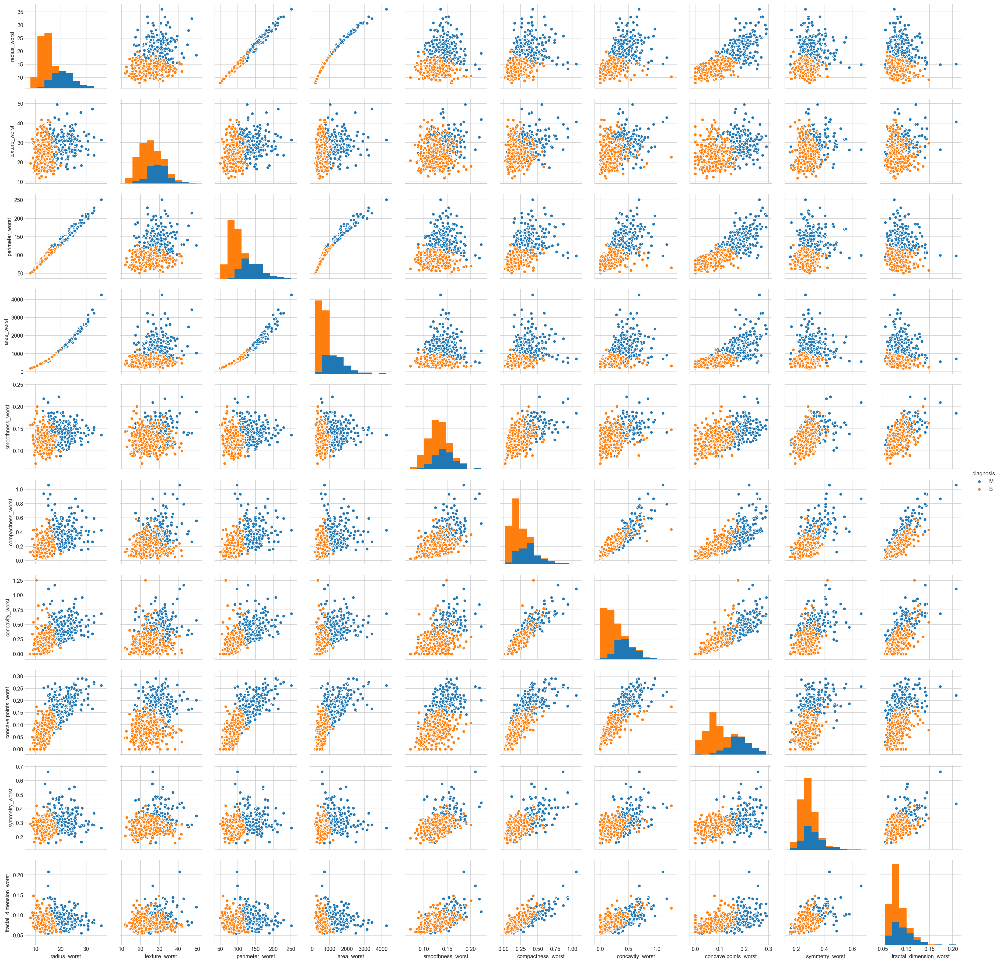

In [30]:
sns.pairplot(all_df[list(all_df.columns[21:]) + ['diagnosis']], hue="diagnosis");

**Summary**

* Mean values of cell radius, perimeter, area, compactness, concavity and concave points can be used in classification of the cancer. Larger values of these parameters tends to show a correlation with malignant tumors.
* Mean values of texture, smoothness, symmetry or fractual dimension does not show a particular preference of one diagnosis over the other.
* In any of the histograms there are no noticeable large outliers that warrants further cleanup.

## 3. Pre-Processing the data

Data preprocessing is a crucial step for any data analysis problem.  It is often a very good idea to prepare our data in such way to best expose the structure of the problem to the machine learning algorithms that you intend to use.This involves a number of activities such as:
* Assigning numerical values to categorical data;
* Handling missing values; and
* Normalizing the features (so that features on small scales do not dominate when fitting a model to the data).

In the previous section we explored the data, to help gain insight on the distribution of the data as well as how the attributes correlate to each other. We identified some features of interest. Now, we will use feature selection to reduce high-dimension data, feature extraction and transformation for dimensionality reduction.

In [31]:
all_df.columns

Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

### 3.1 Handling Categorical Attributes : Label encoding
Here, we transform the class labels from their original string representation (M and B) into integers

In [32]:
from sklearn.preprocessing import LabelEncoder

encoder = LabelEncoder()
diagnosis_encoded = encoder.fit_transform(all_df['diagnosis'])

In [33]:
print(encoder.classes_)

['B' 'M']


After encoding the class labels(diagnosis), the malignant tumors are now represented as class 1(i.e presence of cancer cells) and the benign tumors are represented as class 0 (i.e. no cancer cells detection), respectively.

### 3.3 Feature Standardization

* Standardization is a useful technique to transform attributes with a Gaussian distribution and differing means and standard deviations to a standard Gaussian distribution with a mean of 0 and a standard deviation of 1. 

* As seen in previous exploratory section that the raw data has differing distributions which may have an impact on the most ML algorithms. Most machine learning and optimization algorithms behave much better if features are on the same scale.

Let's evaluate the same algorithms with a standardized copy of the dataset. Here, we use sklearn to scale and transform the data such that each attribute has a mean value of zero and a standard deviation of one.

In [34]:
X = all_df.drop('diagnosis', axis=1)
y = all_df['diagnosis']

In [35]:
from sklearn.preprocessing import StandardScaler

# Normalize the  data (center around 0 and scale to remove the variance).
scaler = StandardScaler()
Xs = scaler.fit_transform(X)

### 3.4 Feature decomposition using Principal Component Analysis( PCA)

From the pair plots in exploratory analysis section above, lot of feature pairs divide nicely the data to a similar extent, therefore, it makes sense to use one of the dimensionality reduction methods to try to use as many features as possible and retain as much information as possible when working with only 2 dimensions. We will use PCA.

Remember, PCA can be applied only on numerical data. Therefore, if the data has categorical variables they must be converted to numerical. Also, make sure we have done the basic data cleaning prior to implementing this technique. The directions of the components are identified in an unsupervised way i.e. the response variable(Y) is not used to determine the component direction. Therefore, it is an unsupervised approach and hence response variable must be removed.

Note that the PCA directions are highly sensitive to data scaling, and most likely we need to standardize the features prior to PCA if the features were measured on different scales and we want to assign equal importance to all features. Performing PCA on un-normalized variables will lead to insanely large loadings for variables with high variance. In turn, this will lead to dependence of a principal component on the variable with high variance. This is undesirable.

In [36]:
feature_names = list(X.columns)

In [37]:
from sklearn.decomposition import PCA

# dimensionality reduction
pca = PCA(n_components=10)

Xs_pca = pca.fit_transform(Xs)

In [38]:
PCA_df = pd.DataFrame()
PCA_df['PCA_1'] = Xs_pca[:,0]
PCA_df['PCA_2'] = Xs_pca[:,1]
PCA_df.sample(5)

,PCA_1,PCA_2
64,1.691608,1.540677
342,-2.077179,1.806519
560,-0.481771,-0.178020
345,-2.431551,3.447204
143,-1.837282,-0.091027


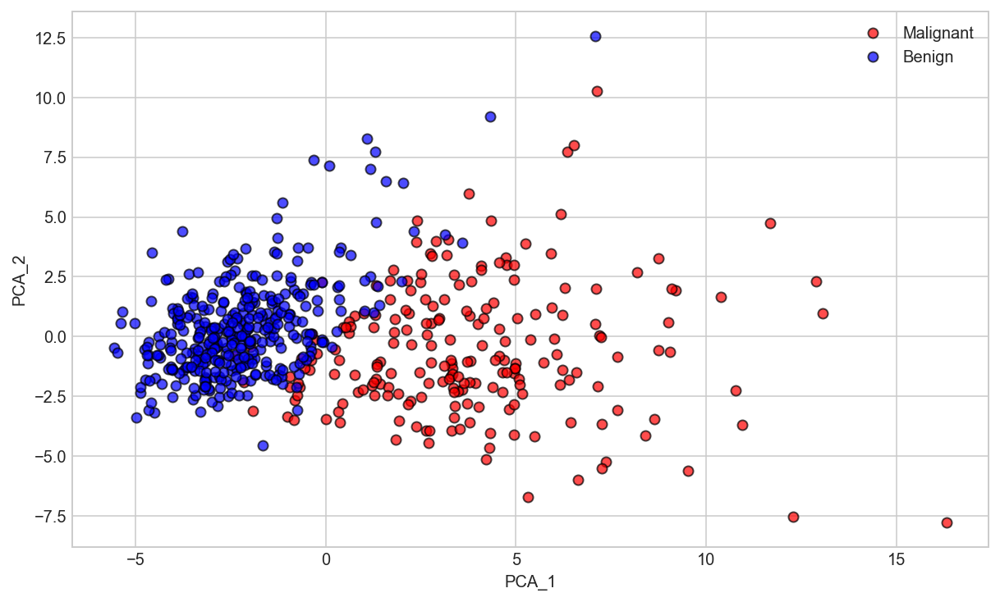

In [39]:
plt.figure(figsize=(10,6))
plt.plot(PCA_df['PCA_1'][all_df['diagnosis'] == 'M'],PCA_df['PCA_2'][all_df['diagnosis'] == 'M'],'ro', alpha = 0.7, markeredgecolor = 'k')
plt.plot(PCA_df['PCA_1'][all_df['diagnosis'] == 'B'],PCA_df['PCA_2'][all_df['diagnosis'] == 'B'],'bo', alpha = 0.7, markeredgecolor = 'k')

plt.xlabel('PCA_1')
plt.ylabel('PCA_2')
plt.legend(['Malignant','Benign']);

Now, what we got after applying the linear PCA transformation is a lower dimensional subspace (from 3D to 2D in this case), where the samples are "most spread" along the new feature axes.

#### Deciding How Many Principal Components to Retain

In order to decide how many principal components should be retained, it is common to summarise the results of a principal components analysis by making a **scree plot**. More about scree plot can be found [here](http://python-for-multivariate-analysis.readthedocs.io/a_little_book_of_python_for_multivariate_analysis.html), and [here](https://www.analyticsvidhya.com/blog/2016/03/practical-guide-principal-component-analysis-python/).

In [40]:
# PCA explained variance - The amount of variance that each PC explains
var_exp = pca.explained_variance_ratio_
var_exp

array([ 0.44272026,  0.18971182,  0.09393163,  0.06602135,  0.05495768,
        0.04024522,  0.02250734,  0.01588724,  0.01389649,  0.01168978])

In [41]:
# Cumulative Variance explains
cum_var_exp = np.cumsum(np.round(pca.explained_variance_ratio_, decimals=4))
cum_var_exp

array([ 0.4427,  0.6324,  0.7263,  0.7923,  0.8473,  0.8875,  0.91  ,
        0.9259,  0.9398,  0.9515])

In [42]:
# combining above two
var_exp_ratios = pca.explained_variance_ratio_.reshape(len(pca.components_), 1)
variance_ratios_df = pd.DataFrame(np.round(var_exp_ratios, 4), columns = ['Explained Variance'])
variance_ratios_df['Cumulative Explained Variance'] = variance_ratios_df['Explained Variance'].cumsum()

# Dimension indexing
dimensions = ['PCA_Component_{}'.format(i) for i in range(1, len(pca.components_) + 1)]

variance_ratios_df.index = dimensions
variance_ratios_df

,Explained Variance,Cumulative Explained Variance
PCA_Component_1,0.4427,0.4427
PCA_Component_2,0.1897,0.6324
PCA_Component_3,0.0939,0.7263
PCA_Component_4,0.0660,0.7923
PCA_Component_5,0.0550,0.8473
PCA_Component_6,0.0402,0.8875
PCA_Component_7,0.0225,0.9100
PCA_Component_8,0.0159,0.9259
PCA_Component_9,0.0139,0.9398
PCA_Component_10,0.0117,0.9515


**Scree Plot**

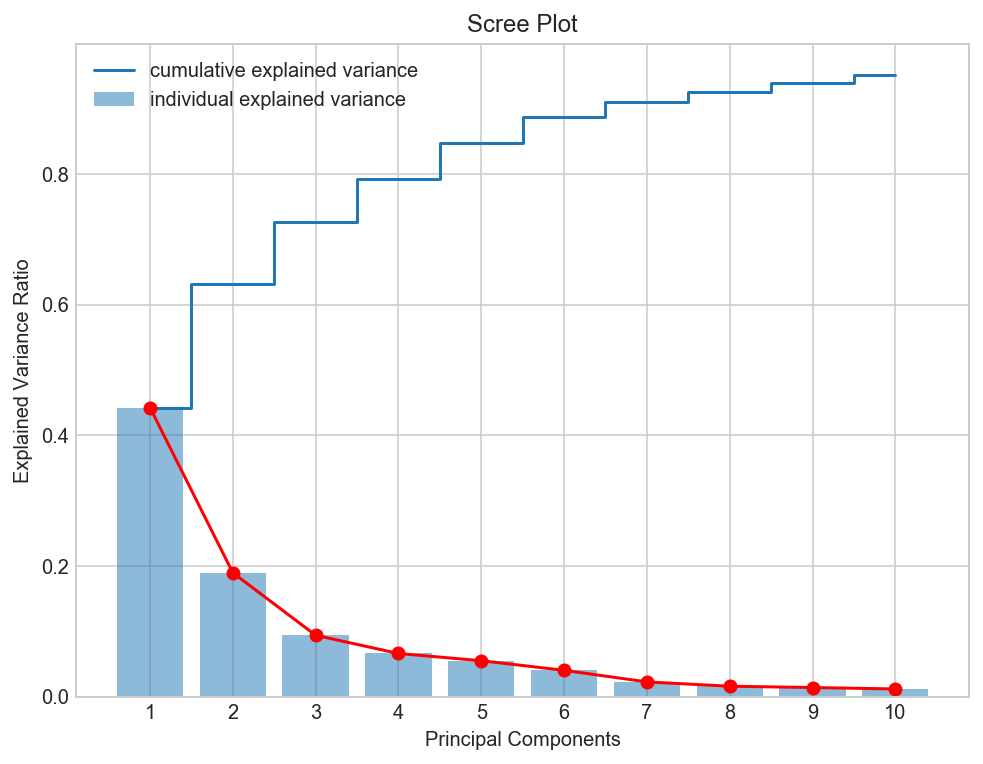

In [43]:
plt.figure(figsize=(8,6))
plt.bar(range(1, len(pca.components_) + 1), var_exp, alpha=0.5, align='center', label='individual explained variance')
plt.step(range(1, len(pca.components_) + 1), cum_var_exp, where='mid', label='cumulative explained variance')
plt.plot(range(1, len(pca.components_) + 1), var_exp, 'ro-')
plt.xticks(range(1, len(pca.components_) + 1))
plt.ylabel('Explained Variance Ratio')
plt.xlabel('Principal Components')
plt.title('Scree Plot')
plt.legend(loc='best');

**Observation**

The most obvious change in slope in the scree plot occurs at component 2, which is the `"elbow"` of the scree plot. Therefore, it cound be argued based on the basis of the scree plot that the first three components should be retained.

#### Principal Components Feature Weights as function of the components: Bar Plot

In [44]:
# PCA components
components_df = pd.DataFrame(np.round(pca.components_, 4), columns = feature_names)

# Dimension indexing
dimensions = ['PCA_{}'.format(i) for i in range(1, len(pca.components_) + 1)]

components_df.index = dimensions
components_df

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
PCA_1,0.2189,0.1037,0.2275,0.2210,0.1426,0.2393,0.2584,0.2609,0.1382,0.0644,0.2060,0.0174,0.2113,0.2029,0.0145,0.1704,0.1536,0.1834,0.0425,0.1026,0.2280,0.1045,0.2366,0.2249,0.1280,0.2101,0.2288,0.2509,0.1229,0.1318
PCA_2,-0.2339,-0.0597,-0.2152,-0.2311,0.1861,0.1519,0.0602,-0.0348,0.1903,0.3666,-0.1056,0.0900,-0.0895,-0.1523,0.2044,0.2327,0.1972,0.1303,0.1838,0.2801,-0.2199,-0.0455,-0.1999,-0.2194,0.1723,0.1436,0.0980,-0.0083,0.1419,0.2753
PCA_3,-0.0085,0.0645,-0.0093,0.0287,-0.1043,-0.0741,0.0027,-0.0256,-0.0402,-0.0226,0.2685,0.3746,0.2666,0.2160,0.3088,0.1548,0.1765,0.2247,0.2886,0.2115,-0.0475,-0.0423,-0.0485,-0.0119,-0.2598,-0.2361,-0.1731,-0.1703,-0.2713,-0.2328
PCA_4,0.0414,-0.6030,0.0420,0.0534,0.1594,0.0318,0.0191,0.0653,0.0671,0.0486,0.0979,-0.3599,0.0890,0.1082,0.0447,-0.0275,0.0013,0.0741,0.0441,0.0153,0.0154,-0.6328,0.0138,0.0259,0.0177,-0.0913,-0.0740,0.0060,-0.0363,-0.0771
PCA_5,0.0378,-0.0495,0.0374,0.0103,-0.3651,0.0117,0.0864,-0.0439,-0.3059,-0.0444,-0.1545,-0.1917,-0.1210,-0.1276,-0.2321,0.2800,0.3540,0.1955,-0.2529,0.2633,-0.0044,-0.0929,0.0075,-0.0274,-0.3244,0.1218,0.1885,0.0433,-0.2446,0.0944
PCA_6,0.0187,-0.0322,0.0173,-0.0019,-0.2864,-0.0141,-0.0093,-0.0520,0.3565,-0.1194,-0.0256,-0.0287,0.0018,-0.0429,-0.3429,0.0692,0.0563,-0.0312,0.4902,-0.0532,-0.0003,-0.0500,0.0085,-0.0252,-0.3693,0.0477,0.0284,-0.0309,0.4989,-0.0802
PCA_7,-0.1241,0.0114,-0.1145,-0.0517,-0.1407,0.0309,-0.1075,-0.1505,-0.0939,0.2958,0.3125,-0.0908,0.3146,0.3467,-0.2440,0.0235,-0.2088,-0.3696,-0.0804,0.1914,-0.0097,0.0099,-0.0004,0.0678,-0.1088,0.1405,-0.0605,-0.1680,-0.0185,0.3747
PCA_8,-0.0075,0.1307,-0.0187,0.0347,-0.2890,-0.1514,-0.0728,-0.1523,-0.2315,-0.1771,0.0225,-0.4754,-0.0119,0.0858,0.5734,0.1175,0.0606,-0.1083,0.2201,0.0112,0.0426,0.0363,0.0306,0.0794,0.2059,0.0840,0.0725,-0.0362,0.2282,0.0484
PCA_9,-0.2231,0.1127,-0.2237,-0.1956,0.0064,-0.1678,0.0406,-0.1120,0.2560,-0.1237,0.2500,-0.2466,0.2272,0.2292,-0.1419,-0.1453,0.3581,0.2725,-0.3041,-0.2137,-0.1121,0.1033,-0.1096,-0.0807,0.1123,-0.1007,0.1619,0.0605,0.0646,-0.1342
PCA_10,0.0955,0.2409,0.0864,0.0750,-0.0693,0.0129,-0.1356,0.0081,0.5721,0.0811,-0.0495,-0.2891,-0.1145,-0.0919,0.1609,0.0435,-0.1413,0.0862,-0.3165,0.3675,0.0774,0.0295,0.0505,0.0699,-0.1283,-0.1721,-0.3116,-0.0766,-0.0296,0.0126


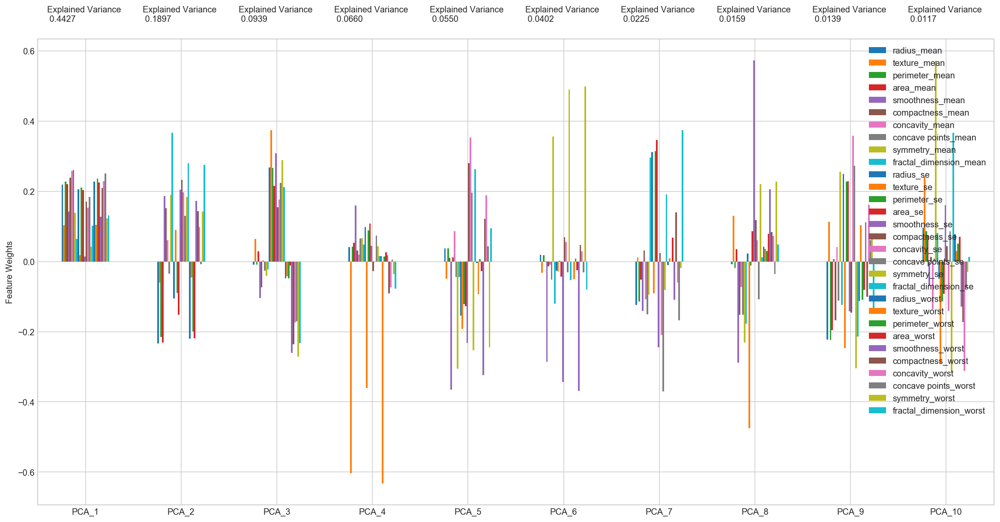

In [45]:
# Plot the feature weights as a function of the components
# Create a bar plot visualization
fig, ax = plt.subplots(figsize = (20, 10))
    
_ = components_df.plot(ax = ax, kind = 'bar')
_ = ax.set_ylabel("Feature Weights")
_ = ax.set_xticklabels(dimensions, rotation=0)

# Display the explained variance ratios
for i, ev in enumerate(pca.explained_variance_ratio_):
    _ = ax.text(i-0.40, ax.get_ylim()[1] + 0.05, "Explained Variance\n %.4f"%(ev))

#### Principal Components Feature Weights as function of the components: HeatMap

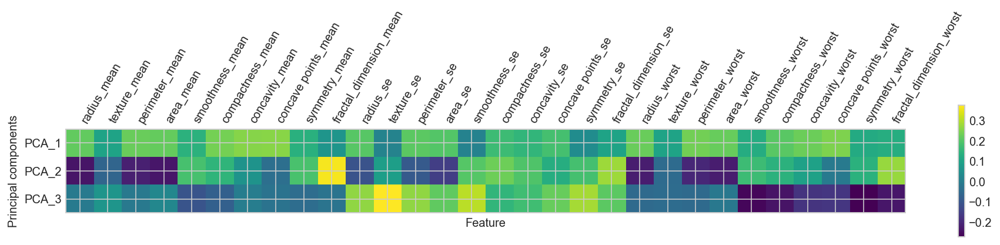

In [46]:
# vizualizing principle components as a heatmap this allows us to see what dimensions in the 'original space' are active
plt.matshow(pca.components_[0:3], cmap='viridis')
plt.yticks([0, 1, 2], ["PCA_1", "PCA_2", "PCA_3"])
plt.colorbar()
plt.xticks(range(len(feature_names)), feature_names, rotation=60, ha='left')
plt.xlabel("Feature")
plt.ylabel("Principal components");

### Visualizing a Biplot : Principal Components Loadings
A biplot is a scatterplot where each data point is represented by its scores along the principal components. The axes are the principal components (in this case `PCA_1` and `PCA_2`). In addition, the biplot shows the projection of the original features along the components. A biplot can help us interpret the reduced dimensions of the data, and discover relationships between the principal components and original features.

In [47]:
# Apply PCA by fitting the scaled data with only two dimensions
from sklearn.decomposition import PCA
pca = PCA(n_components=2).fit(Xs)

# Transform the original data using the PCA fit above
Xs_pca = pca.transform(Xs)

# Create a DataFrame for the pca transformed data
Xs_df = pd.DataFrame(Xs, columns=feature_names)

# Create a DataFrame for the pca transformed data
Xs_pca_df = pd.DataFrame(Xs_pca, columns = ['PCA_1', 'PCA_2'])

In [48]:
pca.components_.T

array([[ 0.21890244, -0.23385713],
       [ 0.10372458, -0.05970609],
       [ 0.22753729, -0.21518136],
       [ 0.22099499, -0.23107671],
       [ 0.14258969,  0.18611302],
       [ 0.23928535,  0.15189161],
       [ 0.25840048,  0.06016536],
       [ 0.26085376, -0.0347675 ],
       [ 0.13816696,  0.19034877],
       [ 0.06436335,  0.36657547],
       [ 0.20597878, -0.10555215],
       [ 0.01742803,  0.08997968],
       [ 0.21132592, -0.08945723],
       [ 0.20286964, -0.15229263],
       [ 0.01453145,  0.20443045],
       [ 0.17039345,  0.2327159 ],
       [ 0.15358979,  0.19720728],
       [ 0.1834174 ,  0.13032156],
       [ 0.04249842,  0.183848  ],
       [ 0.10256832,  0.28009203],
       [ 0.22799663, -0.21986638],
       [ 0.10446933, -0.0454673 ],
       [ 0.23663968, -0.19987843],
       [ 0.22487053, -0.21935186],
       [ 0.12795256,  0.17230435],
       [ 0.21009588,  0.14359317],
       [ 0.22876753,  0.09796411],
       [ 0.25088597, -0.00825724],
       [ 0.12290456,

In [49]:
Xs.shape, pca.components_.T.shape

((569, 30), (30, 2))

In [50]:
# Create a biplot
def biplot(original_data, reduced_data, pca):
    '''
    Produce a biplot that shows a scatterplot of the reduced
    data and the projections of the original features.
    
    original_data: original data, before transformation.
               Needs to be a pandas dataframe with valid column names
    reduced_data: the reduced data (the first two dimensions are plotted)
    pca: pca object that contains the components_ attribute

    return: a matplotlib AxesSubplot object (for any additional customization)
    
    This procedure is inspired by the script:
    https://github.com/teddyroland/python-biplot
    '''

    fig, ax = plt.subplots(figsize = (20, 15))
    # scatterplot of the reduced data    
    ax.scatter(x=reduced_data.loc[:, 'PCA_1'], y=reduced_data.loc[:, 'PCA_2'], 
        facecolors='b', edgecolors='b', s=70, alpha=0.5)
    
    feature_vectors = pca.components_.T

    # we use scaling factors to make the arrows easier to see
    arrow_size, text_pos = 30.0, 32.0,

    # projections of the original features
    for i, v in enumerate(feature_vectors):
        ax.arrow(0, 0, arrow_size*v[0], arrow_size*v[1], 
                  head_width=0.2, head_length=0.2, linewidth=1, color='red')
        ax.text(v[0]*text_pos, v[1]*text_pos, original_data.columns[i], color='black', 
                 ha='center', va='center', fontsize=9)

    ax.set_xlabel("PCA_1", fontsize=14)
    ax.set_ylabel("PCA_2", fontsize=14)
    ax.set_title("PC plane with original feature projections.", fontsize=16);
    return ax

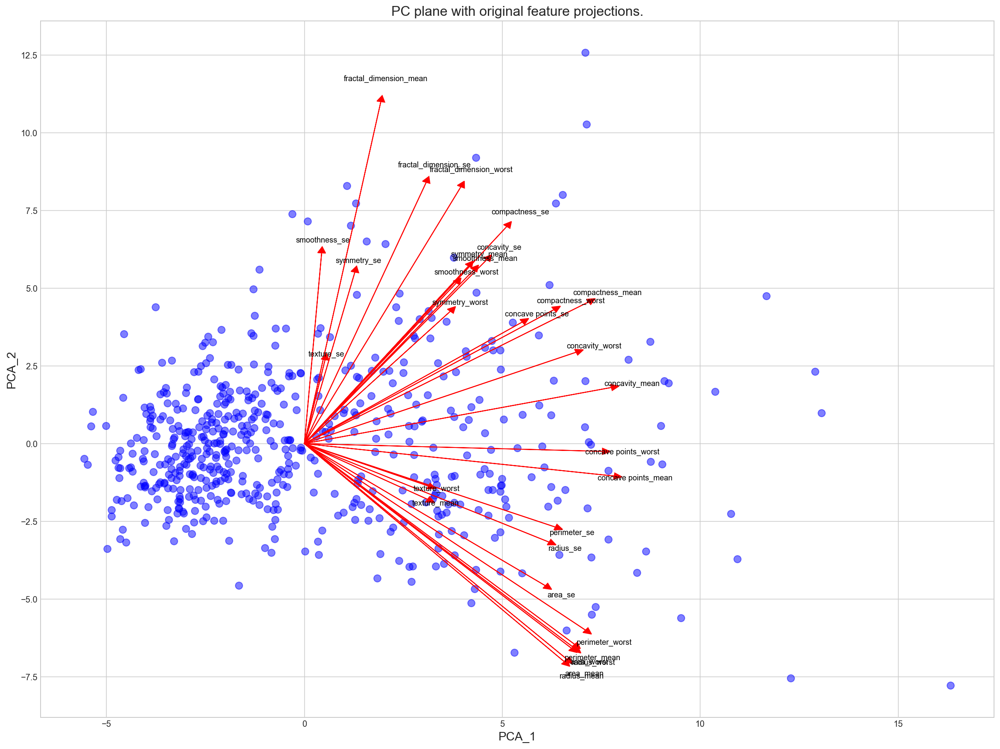

In [51]:
biplot(Xs_df, Xs_pca_df, pca);

#### Principal Components Important Points

- We should not combine the train and test set to obtain PCA components of whole data at once. Because, this would violate the entire assumption of generalization since test data would get 'leaked' into the training set. In other words, the test data set would no longer remain 'unseen'. Eventually, this will hammer down the generalization capability of the model.

- We should not perform PCA on test and train data sets separately. Because, the resultant vectors from train and test PCAs will have different directions ( due to unequal variance). Due to this, we’ll end up comparing data registered on different axes. Therefore, the resulting vectors from train and test data should have same axes.

- We should do exactly the same transformation to the test set as we did to training set, including the center and scaling feature.

### 3.5 Feature decomposition using t-SNE

t-Distributed Stochastic Neighbor Embedding ([t-SNE](http://lvdmaaten.github.io/tsne/)) is another technique for dimensionality reduction and is particularly well suited for the visualization of high-dimensional datasets. Contrary to PCA it is not a mathematical technique but a probablistic one. The original paper describes the working of t-SNE as:

*t-Distributed stochastic neighbor embedding (t-SNE) minimizes the divergence between two distributions: a distribution that measures pairwise similarities of the input objects and a distribution that measures pairwise similarities of the corresponding low-dimensional points in the embedding.*

Essentially what this means is that it looks at the original data that is entered into the algorithm and looks at how to best represent this data using less dimensions by matching both distributions. The way it does this is computationally quite heavy and therefore there are some (serious) limitations to the use of this technique. For example one of the recommendations is that, in case of very high dimensional data, you may need to apply another dimensionality reduction technique before using t-SNE:

*It is highly recommended to use another dimensionality reduction method (e.g. PCA for dense data or TruncatedSVD for sparse data) to reduce the number of dimensions to a reasonable amount (e.g. 50) if the number of features is very high.*

The other key drawback is that since t-SNE scales quadratically in the number of objects N, its applicability is limited to data sets with only a few thousand input objects; beyond that, learning becomes too slow to be practical (and the memory requirements become too large).

In [52]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=rnd_seed)
Xs_tsne = tsne.fit_transform(Xs)

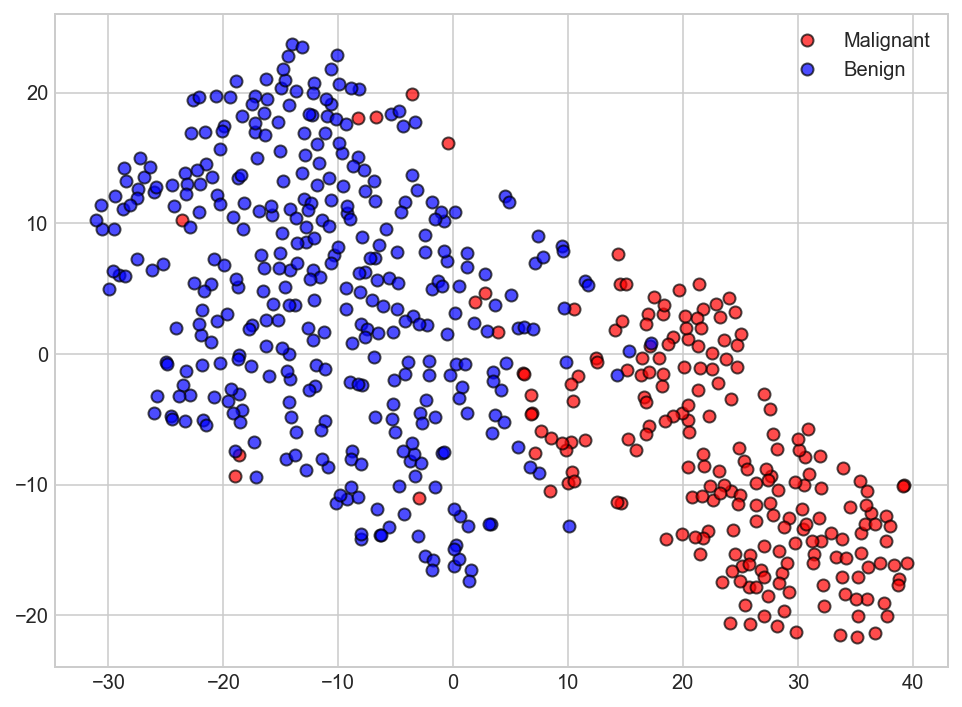

In [53]:
plt.figure(figsize=(8,6))
plt.plot(Xs_tsne[y == 'M'][:, 0], Xs_tsne[y == 'M'][:, 1], 'ro', alpha = 0.7, markeredgecolor='k')
plt.plot(Xs_tsne[y == 'B'][:, 0], Xs_tsne[y == 'B'][:, 1], 'bo', alpha = 0.7, markeredgecolor='k')
plt.legend(['Malignant','Benign']);

It is common to select a subset of features that have the largest correlation with the class labels. The effect of feature selection must be assessed within a complete modeling pipeline in order to give us an unbiased estimated of our model's true performance. Hence, in the next section we will use cross-validation, before applying the PCA-based feature selection strategy in the model building pipeline.

## 4. Predictive model using Support Vector Machine (SVM)

Support vector machines (SVMs) learning algorithm will be used to build the predictive model.  SVMs are one of the most popular classification algorithms, and have an elegant way of transforming nonlinear data so that one can use a linear algorithm to fit a linear model to the data (Cortes and Vapnik 1995)

Kernelized support vector machines are powerful models and perform well on a variety of datasets. 
1. SVMs allow for complex decision boundaries, even if the data has only a few features. 
2. They work well on low-dimensional and high-dimensional data (i.e., few and many features), but don’t scale very well with the number of samples.
    **Running an SVM on data with up to 10,000 samples might work well, but working with datasets of size 100,000 or more can become challenging in terms of runtime and memory usage.**

3. SVMs requires careful preprocessing of the data and tuning of the parameters. This is why, these days, most people instead use tree-based models such as random forests or gradient boosting (which require little or no preprocessing) in many applications.

4.  SVM models are hard to inspect; it can be difficult to understand why a particular prediction was made, and it might be tricky to explain the model to a nonexpert.

#### Important Parameters
The important parameters in kernel SVMs are the
* Regularization parameter C; 
* The choice of the kernel - (linear, radial basis function(RBF) or polynomial);
* Kernel-specific parameters. 

gamma and C both control the complexity of the model, with large values in either resulting in a more complex model. Therefore, good settings for the two parameters are usually strongly correlated, and C and gamma should be adjusted together.

### Split data into training and test sets

The simplest method to evaluate the performance of a machine learning algorithm is to use different training and testing datasets. splitting the data into test and training sets is crucial to avoid overfitting. This allows generalization of real, previously-unseen data. Here we will
* split the available data into a training set and a testing set (70% training, 30% test)
* train the algorithm on the first part
* make predictions on the second part and 
* evaluate the predictions against the expected results

The size of the split can depend on the size and specifics of our dataset, although it is common to use 67% of the data for training and the remaining 33% for testing.

In [54]:
from sklearn.preprocessing import LabelEncoder

# transform the class labels from their original string representation (M and B) into integers
le = LabelEncoder()
all_df['diagnosis'] = le.fit_transform(all_df['diagnosis'])

In [55]:
X = all_df.drop('diagnosis', axis=1) # drop labels for training set
y = all_df['diagnosis']

In [56]:
# # stratified sampling. Divide records in training and testing sets.
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=rnd_seed, stratify=y)

In [57]:
# Normalize the  data (center around 0 and scale to remove the variance).
scaler = StandardScaler()
Xs_train = scaler.fit_transform(X_train)

In [58]:
# Create an SVM classifier and train it on 70% of the data set.
from sklearn.svm import SVC

clf = SVC(C=1.0, kernel='rbf', degree=3, gamma='auto', probability=True)
clf.fit(Xs_train, y_train)

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto', kernel='rbf',
  max_iter=-1, probability=True, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

In [59]:
Xs_test = scaler.transform(X_test)

In [60]:
classifier_score = clf.score(Xs_test, y_test)

In [61]:
print('The classifier accuracy score is {:03.2f}'.format(classifier_score))

The classifier accuracy score is 0.99


To get a better measure of prediction accuracy (which we can use as a proxy for "goodness of fit" of the model), we can successively split the data into folds that we will use for training and testing:

### Classification with cross-validation

Cross-validation extends the idea of train and test set split idea further. Instead of having a single train/test split, we specify **folds** so that the data is divided into similarly-sized folds. 

* Training occurs by taking all folds except one - referred to as the holdout sample.

* On the completion of the training, we test the performance of our fitted model using the holdout sample. 

* The holdout sample is then thrown back with the rest of the other folds, and a different fold is pulled out as the new holdout sample. 

* Training is repeated again with the remaining folds and we measure performance using the holdout sample. This process is repeated until each fold has had a chance to be a test or holdout sample. 

* The expected performance of the classifier, called cross-validation error, is then simply an average of error rates computed on each holdout sample. 

This process is demonstrated by first performing a standard train/test split, and then computing cross-validation error.

In [62]:
# Get average of 3-fold cross-validation score using an SVC estimator.
from sklearn.model_selection import cross_val_score
n_folds = 3
clf_cv = SVC(C=1.0, kernel='rbf', degree=3, gamma='auto')
cv_error = np.average(cross_val_score(clf_cv, Xs_train, y_train, cv=n_folds))

In [63]:
print('The {}-fold cross-validation accuracy score for this classifier is {:.2f}'.format(n_folds, cv_error))

The 3-fold cross-validation accuracy score for this classifier is 0.96


### Classification with Feature Selection & cross-validation

The above evaluations were based on using the entire set of features. We will now employ the correlation-based feature selection strategy to assess the effect of using 3 features which have the best correlation with the class labels.

In [64]:
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.pipeline import Pipeline

# model with just 3 features selected
clf_fs_cv = Pipeline([
    ('feature_selector', SelectKBest(f_classif, k=3)),
    ('svc', SVC(C=1.0, kernel='rbf', degree=3, gamma='auto', probability=True))
])

scores = cross_val_score(clf_fs_cv, Xs_train, y_train, cv=3)

In [65]:
print(scores)
avg = (100 * np.mean(scores), 100 * np.std(scores)/np.sqrt(scores.shape[0]))
print("Average score and uncertainty: (%.2f +- %.3f)%%"  %avg)

[ 0.93283582  0.93939394  0.9469697 ]
Average score and uncertainty: (93.97 +- 0.333)%


From the above results, we can see that only a fraction of the features are required to build a model that performs similarly to models based on using the entire set of features.

Feature selection is an important part of the model-building process that we must always pay particular attention to. The details are beyond the scope of this notebook. In the rest of the analysis, we will continue using the entire set of features.

### Model Accuracy: Receiver Operating Characteristic (ROC) curve

In statistical modeling and machine learning, a commonly-reported performance measure of model accuracy for binary classification problems is Area Under the Curve (AUC).

To understand what information the ROC curve conveys, consider the so-called confusion matrix that essentially is a two-dimensional table where the classifier model is on one axis (vertical), and ground truth is on the other (horizontal) axis, as shown below. Either of these axes can take two values (as depicted)


|                 |Model predicts "+" |Model predicts  "-" |
|---------------- | ----------------- | -------------------|
|** Actual: "+" **| `True positive`   | `False negative`   | 
|** Actual: "-" **| `False positive`  | `True negative`    |
 In an ROC curve, we plot "True Positive Rate" on the Y-axis and "False Positive Rate" on the X-axis, where the values "true positive", "false negative", "false positive", and "true negative" are events (or their probabilities) as described above. The rates are defined according to the following:
* True positive rate (or sensitivity): tpr = tp / (tp + fn)
* False positive rate:       fpr = fp / (fp + tn)
* True negative rate (or specificity): tnr = tn / (fp + tn)

In all definitions, the denominator is a row margin in the above confusion matrix. Thus,one can  express
* the true positive rate (tpr) as the probability that the model says "+" when the real value is indeed "+" (i.e., a conditional probability). However, this does not tell us how likely we are to be correct when calling "+" (i.e., the probability of a true positive, conditioned on the test result being "+").          

In [66]:
# The confusion matrix helps visualize the performance of the algorithm.
from sklearn.metrics import confusion_matrix, classification_report

y_pred = clf.fit(Xs_train, y_train).predict(Xs_test)
cm = confusion_matrix(y_test, y_pred)

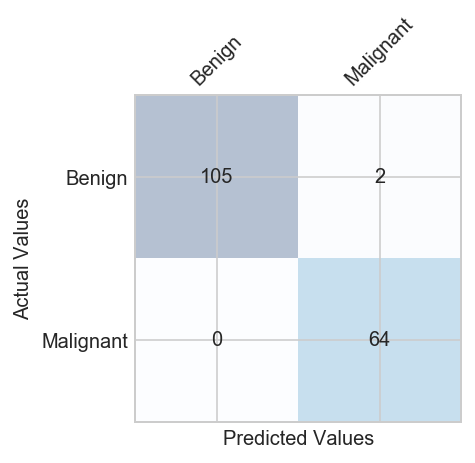

In [67]:
# lengthy way to plot confusion matrix, a shorter way using seaborn is also shown somewhere downa
fig, ax = plt.subplots(figsize=(3, 3))
ax.matshow(cm, cmap=plt.cm.Blues, alpha=0.3)
for i in range(cm.shape[0]):
     for j in range(cm.shape[1]):
         ax.text(x=j, y=i,
                s=cm[i, j], 
                va='center', ha='center')
classes=["Benign","Malignant"]
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)
plt.xlabel('Predicted Values', )
plt.ylabel('Actual Values');

In [68]:
print(classification_report(y_test, y_pred ))

             precision    recall  f1-score   support

          0       1.00      0.98      0.99       107
          1       0.97      1.00      0.98        64

avg / total       0.99      0.99      0.99       171



#### Observation 
There are two possible predicted classes: "1" and "0". Malignant = 1 (indicates prescence of cancer cells) and Benign
= 0 (indicates abscence).

* The classifier made a total of 171 predictions (i.e 171 patients were being tested for the presence breast cancer).
* Out of those 171 cases, the classifier predicted "yes" 66 times, and "no" 105 times.
* In reality, 64 patients in the sample have the disease, and 107 patients do not.

#### Rates as computed from the confusion matrix
1. **Accuracy**: Overall, how often is the classifier correct?
    * (TP+TN)/total = (TP+TN)/(P+N) = (64 + 105)/171 = 0.98

2. **Misclassification Rate**: Overall, how often is it wrong?
    * (FP+FN)/total = (FP+FN)/(P+N) = (2 + 0)/171 = 0.011 equivalent to 1 minus Accuracy also known as ***"Error Rate"***

3. **True Positive Rate:** When it's actually yes, how often does it predict 1? Out of all the positive (majority class) values, how many have been predicted correctly
   * TP/actual yes = TP/(TP + FN) = 64/(64 + 0) = 1.00 also known as ***"Sensitivity"*** or ***"Recall"***

4. **False Positive Rate**: When it's actually 0, how often does it predict 1?
   * FP/actual no = FP/N = FP/(FP + TN) = 2/(2 + 105) = 0.018 equivalent to 1 minus true negative rate

5. **True Negative Rate**: When it's actually 0, how often does it predict 0? Out of all the negative (minority class) values, how many have been predicted correctly’
   * TN/actual no = TN / N = TN/(TN + FP) = 105/(105 + 2) = 0.98 also known as ***Specificity***, equivalent to 1 minus False Positive Rate

6. **Precision**: When it predicts 1, how often is it correct?
   * TP/predicted yes = TP/(TP + FP) = 64/(64 + 2) = 0.97

7. **Prevalence**: How often does the yes condition actually occur in our sample?
   * actual yes/total = 64/171 = 0.34

8. **F score**: It is the harmonic mean of precision and recall. It is used to compare several models side-by-side. Higher the better.
   * 2 x (Precision x Recall)/ (Precision + Recall)  = 2 x (0.97 x 1.00) / (0.97 + 1.00) = 0.98 

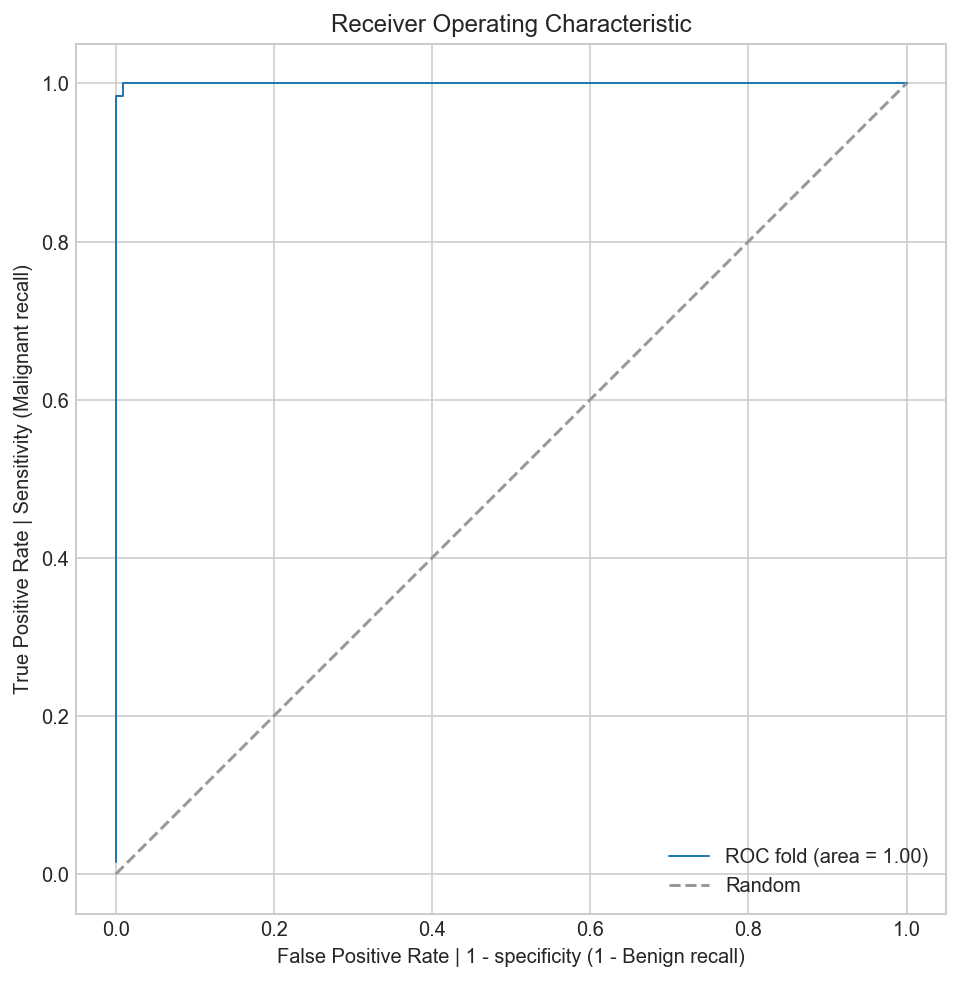

In [69]:
from sklearn.metrics import roc_curve, auc
# Plot the receiver operating characteristic curve (ROC).
plt.figure(figsize=(10,8))
probas_ = clf.predict_proba(Xs_test)
fpr, tpr, thresholds = roc_curve(y_test, probas_[:, 1])
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, lw=1, label='ROC fold (area = %0.2f)' % (roc_auc))
plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6), label='Random')
plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate | 1 - specificity (1 - Benign recall)')
plt.ylabel('True Positive Rate | Sensitivity (Malignant recall)')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.axes().set_aspect(1);

* To interpret the ROC correctly, consider what the points that lie along the diagonal represent. For these situations, there is an equal chance of "+" and "-" happening. Therefore, this is not that different from making a prediction by tossing of an unbiased coin. Put simply, the classification model is random.

* For the points above the diagonal, tpr > fpr, and the model says that we are in a zone where we are performing better than random. For example, assume tpr = 0.99 and fpr = 0.01, Then, the probability of being in the true positive group is (0.99 / (0.99 + 0.01)) = 99. Furthermore, holding fpr constant, it is easy to see that the more vertically above the diagonal we are positioned, the better the classification model.

## 5. Optimizing the SVM Classifier

Machine learning models are parameterized so that their behavior can be tuned for a given problem. Models can have many parameters and finding the best combination of parameters can be treated as a search problem.

### 5.1 Importance of optimizing a classifier

We can tune two key parameters of the SVM algorithm:
* the value of C (how much to relax the margin) 
* and the type of kernel. 

The default for SVM (the SVC class) is to use the Radial Basis Function (RBF) kernel with a C value set to 1.0. We will perform a grid search using 5-fold cross validation with a standardized copy of the training dataset. We will try a number of simpler kernel types and C values with less bias and more bias (less than and more than 1.0 respectively).

Python scikit-learn provides two simple methods for algorithm parameter tuning:
* Grid Search Parameter Tuning. 
* Random Search Parameter Tuning.

In [70]:
from sklearn.model_selection import GridSearchCV

# Train classifiers.
kernel_values = [ 'linear', 'poly', 'rbf', 'sigmoid' ]
param_grid = {'C': np.logspace(-3, 2, 6), 'gamma': np.logspace(-3, 2, 6), 'kernel': kernel_values}

grid = GridSearchCV(SVC(), param_grid=param_grid, cv=5)
grid.fit(Xs_train, y_train)

GridSearchCV(cv=5, error_score='raise',
       estimator=SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto', kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'kernel': ['linear', 'poly', 'rbf', 'sigmoid'], 'gamma': array([  1.00000e-03,   1.00000e-02,   1.00000e-01,   1.00000e+00,
         1.00000e+01,   1.00000e+02]), 'C': array([  1.00000e-03,   1.00000e-02,   1.00000e-01,   1.00000e+00,
         1.00000e+01,   1.00000e+02])},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring=None, verbose=0)

In [71]:
print("The best parameters are %s with a score of %0.2f" % (grid.best_params_, grid.best_score_))

The best parameters are {'kernel': 'rbf', 'gamma': 0.001, 'C': 10.0} with a score of 0.97


In [72]:
best_clf = grid.best_estimator_
best_clf.probability = True

In [73]:
y_pred = best_clf.fit(Xs_train, y_train).predict(Xs_test)
cm = confusion_matrix(y_test, y_pred)

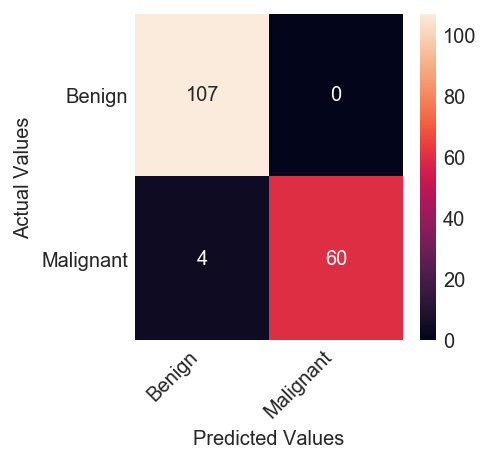

In [74]:
# using seaborn to plot confusion matrix
classes=["Benign","Malignant"]
df_cm = pd.DataFrame(cm, index=classes, columns=classes)
fig = plt.figure(figsize=(3,3))
ax = sns.heatmap(df_cm, annot=True, fmt="d")
ax.yaxis.set_ticklabels(ax.yaxis.get_ticklabels(), rotation=0, ha='right')
ax.xaxis.set_ticklabels(ax.xaxis.get_ticklabels(), rotation=45, ha='right')
plt.xlabel('Predicted Values', )
plt.ylabel('Actual Values');

In [75]:
print(classification_report(y_test, y_pred ))

             precision    recall  f1-score   support

          0       0.96      1.00      0.98       107
          1       1.00      0.94      0.97        64

avg / total       0.98      0.98      0.98       171



### 5.2 Visualizing the SVM Boundary

Based on the best classifier that we got from our optimization process we would now try to visualize the decision boundary of the SVM. In order to visualize the SVM decision boundary we need to reduce the multi-dimensional data to two dimension. We will resort to applying the linear PCA transformation that will transofrm our data to a lower dimensional subspace (from 30D to 2D in this case).

In [76]:
# Apply PCA by fitting the scaled data with only two dimensions
from sklearn.decomposition import PCA
pca = PCA(n_components=2)

# Transform the original data using the PCA fit above
Xs_train_pca = pca.fit_transform(Xs_train)

In [77]:
# Take the first two PCA features. We could avoid this by using a two-dim dataset
X = Xs_train_pca
y = y_train

In [78]:
# http://scikit-learn.org/stable/auto_examples/svm/plot_iris.html
def make_meshgrid(x, y, h=.02):
    """Create a mesh of points to plot in

    Parameters
    ----------
    x: data to base x-axis meshgrid on
    y: data to base y-axis meshgrid on
    h: stepsize for meshgrid, optional

    Returns
    -------
    xx, yy : ndarray
    """
    x_min, x_max = x.min() - 1, x.max() + 1
    y_min, y_max = y.min() - 1, y.max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    return xx, yy

In [79]:
# http://scikit-learn.org/stable/auto_examples/svm/plot_iris.html
def plot_contours(ax, clf, xx, yy, **params):
    """Plot the decision boundaries for a classifier.

    Parameters
    ----------
    ax: matplotlib axes object
    clf: a classifier
    xx: meshgrid ndarray
    yy: meshgrid ndarray
    params: dictionary of params to pass to contourf, optional
    """
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    out = ax.contourf(xx, yy, Z, **params)
    return out

In [80]:
# create a mesh of values from the 1st two PCA components
X0, X1 = X[:, 0], X[:, 1]
xx, yy = make_meshgrid(X0, X1)

In [81]:
clf = SVC(C=10.0, kernel='rbf', gamma=0.001)
clf.fit(X, y)

SVC(C=10.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma=0.001, kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

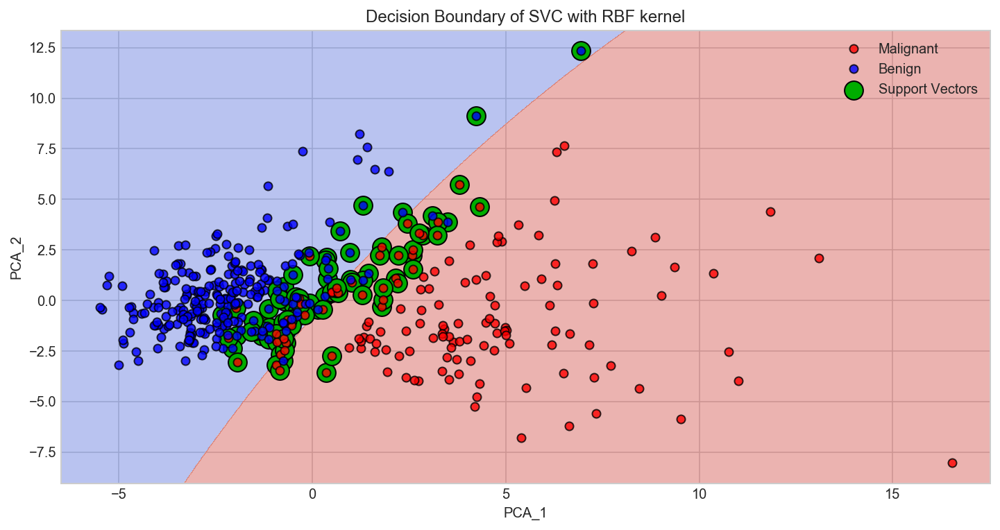

In [82]:
fig, ax = plt.subplots(figsize=(12,6))
plot_contours(ax, clf, xx, yy, cmap=plt.cm.coolwarm, alpha=0.4)
plt.plot(Xs_train_pca[y_train == 1][:, 0],Xs_train_pca[y_train == 1][:, 1], 'ro', alpha=0.8, markeredgecolor='k', label='Malignant')
plt.plot(Xs_train_pca[y_train == 0][:, 0],Xs_train_pca[y_train == 0][:, 1], 'bo', alpha=0.8, markeredgecolor='k', label='Benign')

svs = clf.support_vectors_
plt.scatter(svs[:, 0], svs[:, 1], s=180, facecolors='#00AD00', edgecolors='k', label='Support Vectors')
    
plt.xlim(xx.min(), xx.max())
plt.ylim(yy.min(), yy.max())
plt.xlabel('PCA_1')
plt.ylabel('PCA_2')
plt.title('Decision Boundary of SVC with RBF kernel')
plt.legend();

## 6. Automate the ML process using pipelines 

There are standard workflows in a machine learning project that can be automated. In Python `scikit-learn`, Pipelines help to clearly define and automate these workflows.
* Pipelines help overcome common problems like data leakage in our test harness. 
* Python scikit-learn provides a Pipeline utility to help automate machine learning workflows.
* Pipelines work by allowing for a linear sequence of data transforms to be chained together culminating in a modeling process that can be evaluated.

### 6.1 Data Preparation and Modeling Pipeline

####  Evaluate Some Algorithms
Now it is time to create some models of the data and estimate their accuracy on unseen data. Here is what we are going to cover in this step:
1. Separate out a validation dataset.
2. Setup the test harness to use 10-fold cross validation.
3. Build 5 different models  
4. Select the best model

#### Validation Dataset

In [83]:
# read the data
all_df = pd.read_csv('data/data.csv', index_col=False)
all_df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [84]:
all_df.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

In [85]:
# Id column is redundant and not useful, we want to drop it
all_df.drop('id', axis =1, inplace=True)

In [86]:
from sklearn.preprocessing import LabelEncoder

# transform the class labels from their original string representation (M and B) into integers
le = LabelEncoder()
all_df['diagnosis'] = le.fit_transform(all_df['diagnosis'])

In [87]:
X = all_df.drop('diagnosis', axis=1) # drop labels for training set
y = all_df['diagnosis']

In [88]:
# Divide records in training and testing sets: stratified sampling
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=7, stratify=y)

In [89]:
# Normalize the  data (center around 0 and scale to remove the variance).
scaler = StandardScaler()
Xs_train = scaler.fit_transform(X_train)

### 6.2 Evaluate Algorithms: Baseline

In [90]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB

from sklearn.model_selection import train_test_split, KFold, StratifiedKFold
from sklearn.model_selection import cross_val_score

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

from sklearn.decomposition import PCA

from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

# Spot-Check Algorithms
models = []
models.append(('LR', LogisticRegression()))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC()))

# Test options and evaluation metric
num_folds = 10
num_instances = len(X_train)
scoring = 'accuracy'
results = []
names = []
for name, model in models:
    kf = KFold(n_splits=num_folds, random_state=rnd_seed)
    cv_results = cross_val_score(model, X_train, y_train, cv=kf, scoring=scoring, n_jobs=-1)
    results.append(cv_results)
    names.append(name)

In [91]:
print('10-Fold cross-validation accuracy score for the training data for all the classifiers') 
for name, cv_results in zip(names, results):
    print("%-10s: %.6f (%.6f)" % (name, cv_results.mean(), cv_results.std()))

10-Fold cross-validation accuracy score for the training data for all the classifiers
LR        : 0.952372 (0.041013)
LDA       : 0.967308 (0.035678)
KNN       : 0.932179 (0.037324)
CART      : 0.969936 (0.029144)
NB        : 0.937308 (0.042266)
SVM       : 0.627885 (0.070174)


**Observation**

The results suggest That both Logistic Regression and LDA may be worth further study. These are just mean accuracy values. It is always wise to look at the distribution of accuracy values calculated across cross validation folds. We can do that graphically using box and whisker plots.

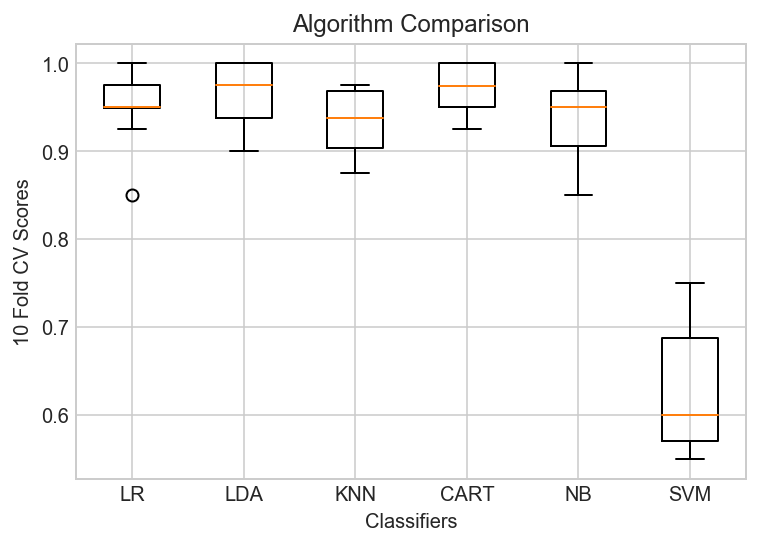

In [92]:
# Compare Algorithms
plt.title( 'Algorithm Comparison' )
plt.boxplot(results)
plt.xlabel('Classifiers')
plt.ylabel('10 Fold CV Scores')
plt.xticks(np.arange(len(names)) + 1, names);

**Observation**

The results show a similar tight distribution for all classifiers except SVM which is encouraging, suggesting low variance. The poor results for SVM are surprising.

It is possible the varied distribution of the attributes may have an effect on the accuracy of algorithms such as SVM. In the next section we will repeat this spot-check with a standardized copy of the training dataset.

### 6.3 Evaluate Algorithms: Standardize Data

In [93]:
# Standardize the dataset
pipelines = []
pipelines.append(('ScaledLR', Pipeline([('Scaler', StandardScaler()),('LR', LogisticRegression())])))
pipelines.append(('ScaledLDA', Pipeline([('Scaler', StandardScaler()),('LDA', LinearDiscriminantAnalysis())])))
pipelines.append(('ScaledKNN', Pipeline([('Scaler', StandardScaler()),('KNN', KNeighborsClassifier())])))
pipelines.append(('ScaledCART', Pipeline([('Scaler', StandardScaler()),('CART', DecisionTreeClassifier())])))
pipelines.append(('ScaledNB', Pipeline([('Scaler', StandardScaler()),('NB', GaussianNB())])))
pipelines.append(('ScaledSVM', Pipeline([('Scaler', StandardScaler()),('SVM', SVC())])))

results = []
names = []
for name, model in pipelines:
    kf = KFold(n_splits=num_folds, random_state=rnd_seed)
    cv_results = cross_val_score(model, X_train, y_train, cv=kf, scoring=scoring, n_jobs=-1)
    results.append(cv_results)
    names.append(name)

In [94]:
print('10-Fold cross-validation accuracy score for the training data for all the classifiers') 
for name, cv_results in zip(names, results):
    print("%-10s: %.6f (%.6f)" % (name, cv_results.mean(), cv_results.std()))

10-Fold cross-validation accuracy score for the training data for all the classifiers
ScaledLR  : 0.984936 (0.022942)
ScaledLDA : 0.967308 (0.035678)
ScaledKNN : 0.952179 (0.038156)
ScaledCART: 0.934679 (0.034109)
ScaledNB  : 0.937244 (0.043887)
ScaledSVM : 0.969936 (0.038398)


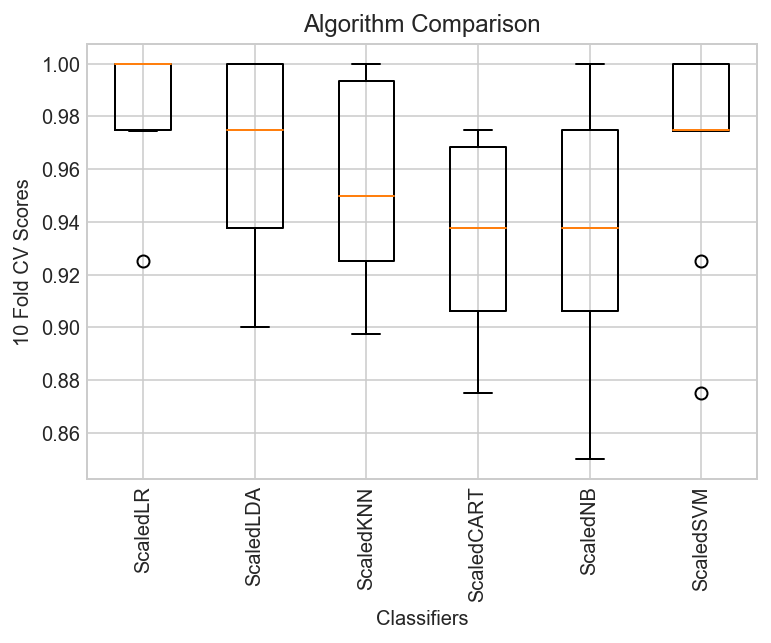

In [95]:
# Compare Algorithms
plt.title( 'Algorithm Comparison' )
plt.boxplot(results)
plt.xlabel('Classifiers')
plt.ylabel('10 Fold CV Scores')
plt.xticks(np.arange(len(names)) + 1, names, rotation="90");

**Observations**

The results show that standardization of the data has lifted the skill of SVM to be the most accurate algorithm tested so far.

The results suggest digging deeper into the SVM and LDA and LR algorithms. It is very likely that configuration beyond the default may yield even more accurate models.

### 6.4 Algorithm Tuning
In this section we investigate tuning the parameters for three algorithms that show promise from the spot-checking in the previous section: LR, LDA and SVM.

#### Tuning hyper-parameters - SVC estimator

In [96]:
# Make Support Vector Classifier Pipeline
pipe_svc = Pipeline([('scl', StandardScaler()),
                     ('pca', PCA(n_components=2)),
                     ('clf', SVC(probability=True, verbose=False))])

In [97]:
# Fit Pipeline to training data and score
scores = cross_val_score(estimator=pipe_svc, X=X_train, y=y_train, cv=10, n_jobs=-1, verbose=0)
print('SVC Model Training Accuracy: %.3f +/- %.3f' %(np.mean(scores), np.std(scores)))

SVC Model Training Accuracy: 0.942 +/- 0.034


In [98]:
from sklearn.model_selection import GridSearchCV

# Tune Hyperparameters
param_range = [0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0]
param_grid = [{'clf__C': param_range,'clf__kernel': ['linear']},
              {'clf__C': param_range,'clf__gamma': param_range, 'clf__kernel': ['rbf']}]

gs_svc = GridSearchCV(estimator=pipe_svc,
                  param_grid=param_grid,
                  scoring='accuracy',
                  cv=10,
                  n_jobs=-1)

gs_svc = gs_svc.fit(X_train, y_train)

In [99]:
gs_svc.best_estimator_.named_steps

{'clf': SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
   decision_function_shape='ovr', degree=3, gamma='auto', kernel='linear',
   max_iter=-1, probability=True, random_state=None, shrinking=True,
   tol=0.001, verbose=False),
 'pca': PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
   svd_solver='auto', tol=0.0, whiten=False),
 'scl': StandardScaler(copy=True, with_mean=True, with_std=True)}

In [100]:
gs_svc.best_estimator_.named_steps['clf'].coef_

array([[ 1.57606226, -0.87384284]])

In [101]:
gs_svc.best_estimator_.named_steps['clf'].support_vectors_

array([[ -5.59298401e-03,   2.54545060e-02],
       [ -3.36380410e-01,  -2.57254998e-01],
       [ -3.38622032e-01,  -7.19898441e-01],
       [ -7.04681309e-01,  -2.09847293e+00],
       [ -1.29967755e+00,  -1.62913054e+00],
       [ -8.48983391e-02,  -1.45496113e-01],
       [ -4.64780833e-01,  -9.01859111e-01],
       [  1.42724855e+00,   1.42660623e+00],
       [ -7.60785538e-01,  -1.16034158e+00],
       [  2.88483593e+00,   4.20900482e+00],
       [  1.94950775e+00,   2.36149488e+00],
       [ -1.54668166e+00,  -4.47823571e+00],
       [ -1.05181400e+00,  -1.30862774e+00],
       [  6.53277729e+00,   1.24974670e+01],
       [ -1.18800512e+00,  -1.55908705e+00],
       [ -6.16694586e-01,  -1.43967224e+00],
       [ -6.72611104e-01,  -1.22372306e+00],
       [  2.19235999e+00,   4.45143040e+00],
       [  1.27634550e+00,   1.13317453e+00],
       [ -4.60409592e-01,  -2.02632100e-01],
       [  5.54733653e-02,  -4.71520085e-02],
       [  1.33960706e+00,   2.17971509e+00],
       [  

In [102]:
print('SVC Model Tuned Parameters Best Score: ', gs_svc.best_score_)
print('SVC Model Best Parameters: ', gs_svc.best_params_)

SVC Model Tuned Parameters Best Score:  0.957286432161
SVC Model Best Parameters:  {'clf__C': 1.0, 'clf__kernel': 'linear'}


#### Tuning the hyper-parameters - k-NN hyperparameters
 For our standard k-NN implementation, there are two primary hyperparameters that we’ll want to tune:

* The number of neighbors k.
* The distance metric/similarity function.

Both of these values can dramatically affect the accuracy of our k-NN classifier. Grid object is ready to do 10-fold cross validation on a KNN model using classification accuracy as the evaluation metric. In addition, there is a parameter grid to repeat the 10-fold cross validation process 30 times. Each time, the n_neighbors parameter should be given a different value from the list.

We can't give `GridSearchCV` just a list  
We've to specify `n_neighbors` should take on 1 through 30  
We can set `n_jobs` = -1 to run computations in parallel (if supported by your computer and OS) 

In [103]:
from sklearn.neighbors import KNeighborsClassifier as KNN

pipe_knn = Pipeline([('scl', StandardScaler()),
                     ('pca', PCA(n_components=2)),
                     ('clf', KNeighborsClassifier())])

In [104]:
#Fit Pipeline to training data and score
scores = cross_val_score(estimator=pipe_knn, 
                         X=X_train, 
                         y=y_train, 
                         cv=10,
                         n_jobs=-1)
print('Knn Model Training Accuracy: %.3f +/- %.3f' %(np.mean(scores), np.std(scores)))

Knn Model Training Accuracy: 0.945 +/- 0.027


In [105]:
# Tune Hyperparameters
param_range = range(1, 31)
param_grid = [{'clf__n_neighbors': param_range}]
# instantiate the grid
grid = GridSearchCV(estimator=pipe_knn, 
                    param_grid=param_grid, 
                    cv=10, 
                    scoring='accuracy',
                    n_jobs=-1)
gs_knn = grid.fit(X_train, y_train)

In [106]:
print('Knn Model Tuned Parameters Best Score: ', gs_knn.best_score_)
print('Knn Model Best Parameters: ', gs_knn.best_params_)

Knn Model Tuned Parameters Best Score:  0.947236180905
Knn Model Best Parameters:  {'clf__n_neighbors': 6}


### 6.5 Finalize Model

In [107]:
# Use best parameters
final_clf_svc = gs_svc.best_estimator_

# Get Final Scores
scores = cross_val_score(estimator=final_clf_svc,
                         X=X_train,
                         y=y_train,
                         cv=10,
                         n_jobs=-1)

In [108]:
print('Final Model Training Accuracy: %.3f +/- %.3f' %(np.mean(scores), np.std(scores)))
print('Final Accuracy on Test set: %.5f' % final_clf_svc.score(X_test, y_test))

Final Model Training Accuracy: 0.957 +/- 0.027
Final Accuracy on Test set: 0.95322


In [109]:
#clf_svc.fit(X_train, y_train)
y_pred = final_clf_svc.predict(X_test)

In [110]:
print(accuracy_score(y_test, y_pred))

0.953216374269


In [111]:
print(confusion_matrix(y_test, y_pred))

[[105   2]
 [  6  58]]


In [112]:
print(classification_report(y_test, y_pred))

             precision    recall  f1-score   support

          0       0.95      0.98      0.96       107
          1       0.97      0.91      0.94        64

avg / total       0.95      0.95      0.95       171

